In [121]:
import pandas as pd
import pickle
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

# Circuit Analysis and Error rate Calculations

## Circuit Analysis

In [141]:
with open(f'../../Simulator execution/circuits/ibm_brisbane_4_1.pkl', 'rb') as f:
    circuit_data = pickle.load(f)

In [144]:
circuit_data['circuit'][0].count_ops()

OrderedDict([('rz', 61),
             ('sx', 18),
             ('rzx', 18),
             ('rx', 10),
             ('measure', 4),
             ('barrier', 1)])

## Circuit Reliability graph

In [147]:
data = []

for system in ['ibm_brisbane','ibm_kyoto','ibm_nazca','ibm_sherbrooke']:
    for N in [4,6,8,10]:
        for T in [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0]:
            # Load the circuit data
                with open(f'../../Simulator execution/circuits/{system}_{N}_{str(T).replace('.','-')}.pkl', 'rb') as f:
                    circuit_data = pickle.load(f)

                # Get the circuit data
                layout = circuit_data['layout']
                circuits = circuit_data['circuit']
                reliabilities = circuit_data['circuit_reliabilities']

                data.append({'System':system,'N':N,'T':T,'reliability':reliabilities[0]})

df = pd.DataFrame(data)

In [138]:
dfs = {}
dfs['ibm_brisbane'] = df[df['System'] == 'ibm_brisbane'][['N','T','reliability']]
dfs['ibm_kyoto'] = df[df['System'] == 'ibm_kyoto'][['N','T','reliability']]
dfs['ibm_nazca'] = df[df['System'] == 'ibm_nazca'][['N','T','reliability']]
dfs['ibm_sherbrooke'] = df[df['System'] == 'ibm_sherbrooke'][['N','T','reliability']]

systems = list(dfs.keys())

heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    heatmap_data = df.pivot_table(index='N', columns='T', values='reliability').sort_values(by='N', ascending=False)
    heatmap_datas[system] = heatmap_data

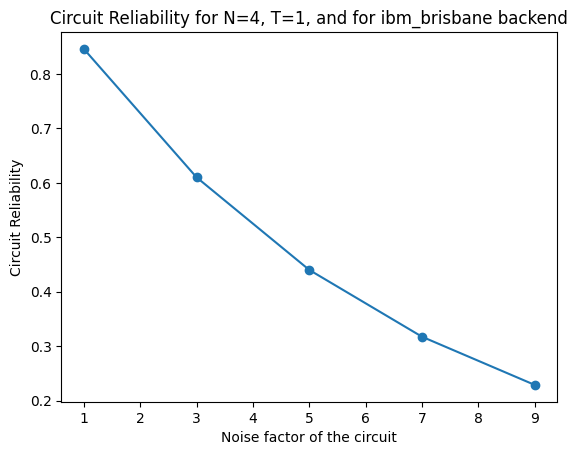

In [159]:
import matplotlib.pyplot as plt
import pickle

# Load the data from the pickle file
with open('../../Simulator execution/circuits/ibm_brisbane_4_1.pkl', 'rb') as f:
    circuit_data = pickle.load(f)

# Extract x and y values from the loaded data
x_values = [1, 3, 5, 7, 9]
y_values = circuit_data['circuit_reliabilities']

# Create a line plot
plt.plot(x_values, y_values, marker='o', linestyle='-')

# Add labels and title
plt.xlabel('Noise factor of the circuit')
plt.ylabel('Circuit Reliability')
plt.title('Circuit Reliability for N=4, T=1, and for ibm_brisbane backend')

# Show the plot
plt.show()


In [155]:
y_values

[0.845740815951508,
 0.6100744093010173,
 0.4400766498010961,
 0.3174489123745543,
 0.2289914995793]

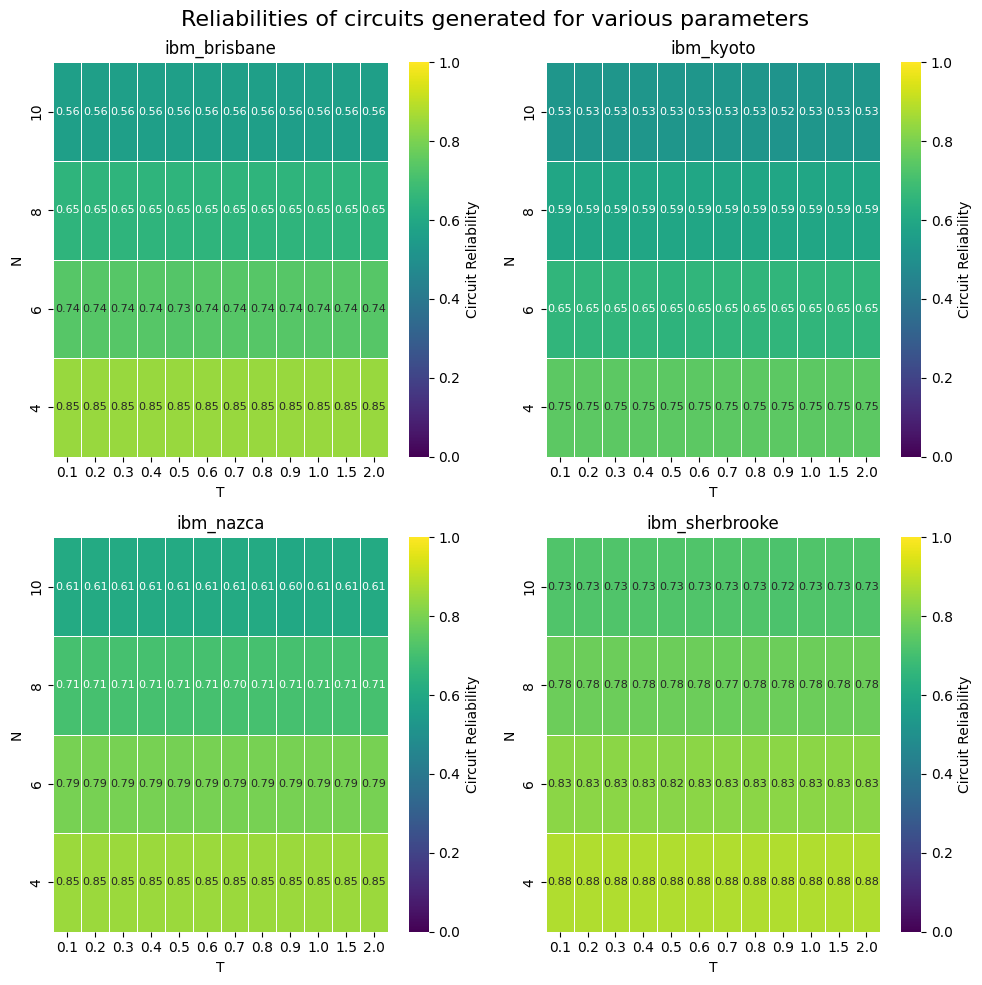

In [140]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    sns.heatmap(heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Circuit Reliability'}, 
                annot_kws={"size": 8}, 
                ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('T')
    ax.set_ylabel('N')

plt.suptitle('Reliabilities of circuits generated for various parameters', fontsize=16)
plt.tight_layout()
plt.show()

# ZNE

In [162]:
with open('Real hardware execution/ibm_nazca_distribution_data.pkl', 'rb') as f:
    ibm_nazca = pickle.load(f)

In [171]:
ibm_nazca[0].columns

Index(['State', 'Ideal probability', 'Noise factor 1 probability',
       'Noise factor 3 probability', 'Noise factor 5 probability',
       'Noise factor 7 probability', 'Noise factor 9 probability',
       'ZNE probability distribution', 'FFZNE probability distribution',
       'RBZNE probability distribution'],
      dtype='object')

In [174]:
points = list(ibm_nazca[9].loc['0000'][['Ideal probability','Noise factor 1 probability','Noise factor 3 probability','Noise factor 5 probability','Noise factor 7 probability','Noise factor 9 probability']])

In [175]:
ideal_point = points[0]
noisy_points = points[1:4]
x_values = [1,3,5]


[0.21072942962058566,
 0.1279296875,
 0.038330078125,
 0.061279296875,
 0.0615234375,
 0.068603515625]

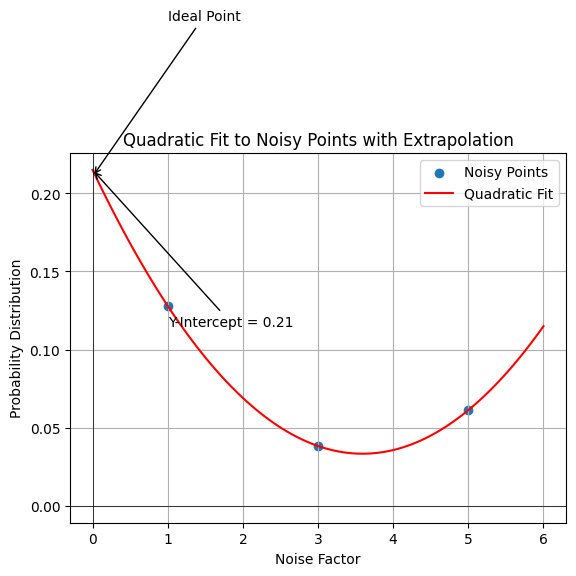

In [178]:
import numpy as np
import matplotlib.pyplot as plt

# Define the noisy points
noisy_points = np.array(points[1:4])

# Define the x values
x_values = np.array([1, 3, 5])

# Define the ideal point
ideal_point = points[0]

# Fit the points to a quadratic polynomial
coefficients = np.polyfit(x_values, noisy_points, 2)
poly = np.poly1d(coefficients)

# Generate x values for the plot
x_values_plot = np.linspace(0, 6, 100)

# Evaluate the polynomial at the generated x values
y_values_plot = poly(x_values_plot)

# Plot the noisy points and the fitted quadratic polynomial
plt.scatter(x_values, noisy_points, label='Noisy Points')
plt.plot(x_values_plot, y_values_plot, label='Quadratic Fit', color='red')
plt.axhline(0, color='black', linewidth=0.5)
plt.axvline(0, color='black', linewidth=0.5)
plt.xlabel('Noise Factor')
plt.ylabel('Probability Distribution')
plt.title('Quadratic Fit to Noisy Points with Extrapolation')
plt.legend()
plt.grid(True)

# Show y-intercept
y_intercept = poly(0)
plt.annotate(f'Y-Intercept = {y_intercept:.2f}', xy=(0, y_intercept), xytext=(1, y_intercept - 0.1),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

# Annotate the ideal point
plt.annotate('Ideal Point = {ideal_point:.2f}', xy=(0, ideal_point), xytext=(1, ideal_point + 0.1),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

plt.show()


# Simulator Results Analysis

In [4]:
# Load the data
with open('Simulator execution/simulator_data_df.pkl', 'rb') as f:
    simulator_data_df = pickle.load(f)

## Noise Plots

### Noise free Simulation

In [13]:
data = simulator_data_df

dfs = {}
dfs['ibm'] = data[data['System'] == 'ibm_brisbane'][['N','T','Without Noise HF','Without Noise TV']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='Without Noise HF').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='Without Noise TV').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

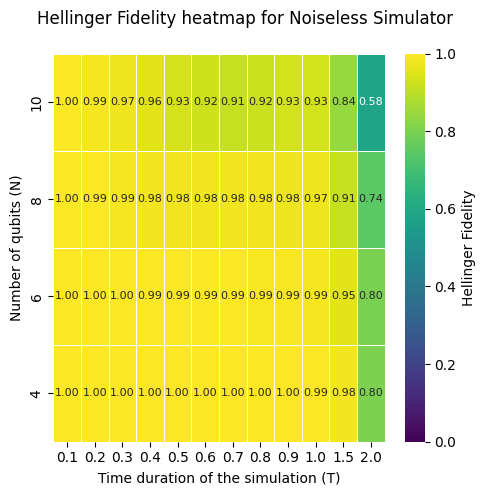

In [19]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 1, figsize=(5, 5))


sns.heatmap(hf_heatmap_datas['ibm'], 
            cmap='viridis', 
            linewidths=0.5, 
            annot=True, 
            fmt=".2f", 
            cbar_kws={'label': 'Hellinger Fidelity'}, 
            annot_kws={"size": 8}, 
            vmin=0, 
            vmax=1
            )
    
axes.set_xlabel('Time duration of the simulation (T)')
axes.set_ylabel('Number of qubits (N)')

plt.suptitle('Hellinger Fidelity heatmap for Noiseless Simulator', fontsize=12)
plt.tight_layout()
plt.show()

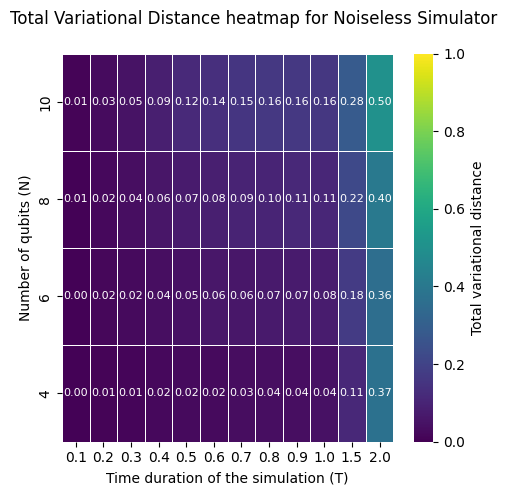

In [20]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 1, figsize=(5, 5))


sns.heatmap(tv_heatmap_datas['ibm'], 
            cmap='viridis', 
            linewidths=0.5, 
            annot=True, 
            fmt=".2f", 
            cbar_kws={'label': 'Total variational distance'}, 
            annot_kws={"size": 8},
            vmin=0, 
            vmax=1
            )
    
axes.set_xlabel('Time duration of the simulation (T)')
axes.set_ylabel('Number of qubits (N)')

plt.suptitle('Total Variational Distance heatmap for Noiseless Simulator', fontsize=12)
plt.tight_layout()
plt.show()

### Execution on Noisy Simulator

In [107]:
data = simulator_data_df

dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','Noise HF','Noise TV']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','Noise HF','Noise TV']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','Noise HF','Noise TV']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','Noise HF','Noise TV']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='Noise HF').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='Noise TV').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

#### Hellinger Fidelity

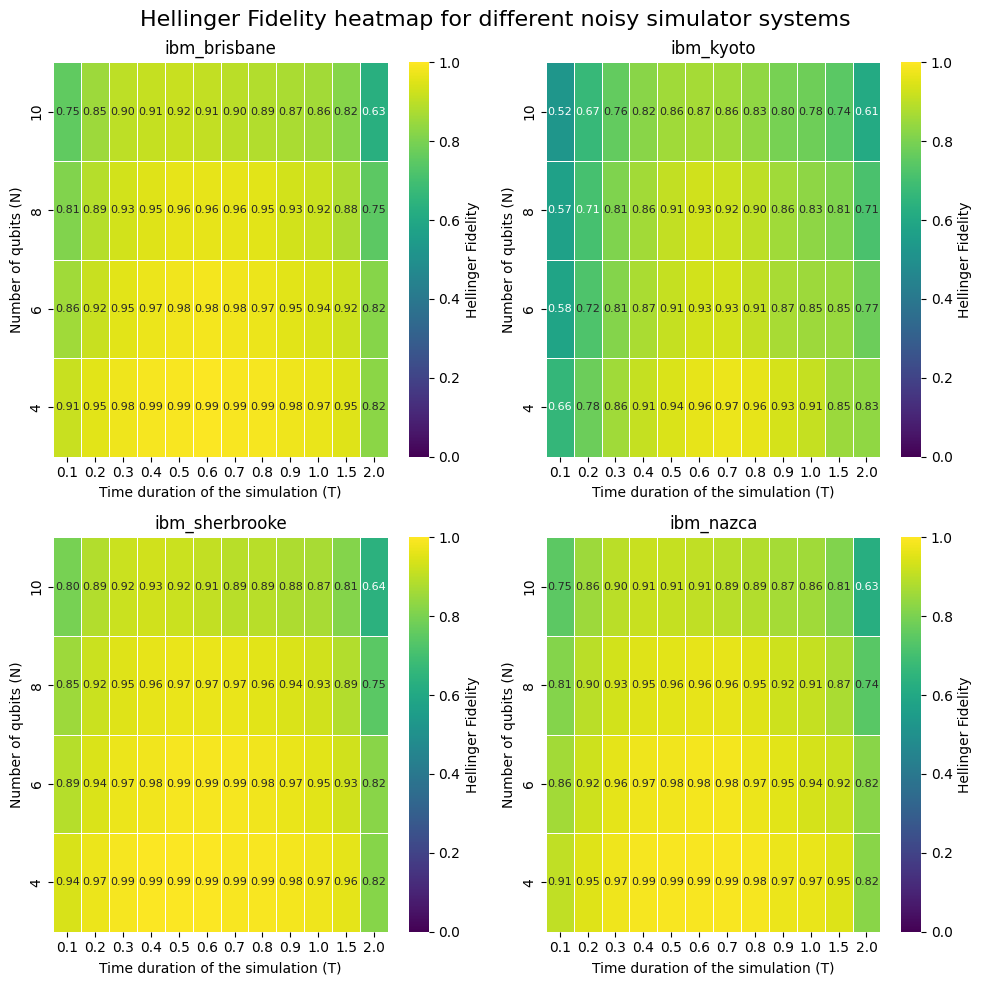

In [108]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    sns.heatmap(hf_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Hellinger Fidelity'}, 
                annot_kws={"size": 8}, 
                ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Hellinger Fidelity heatmap for different noisy simulator systems', fontsize=16)
plt.tight_layout()
plt.show()

#### Total Variational Distance

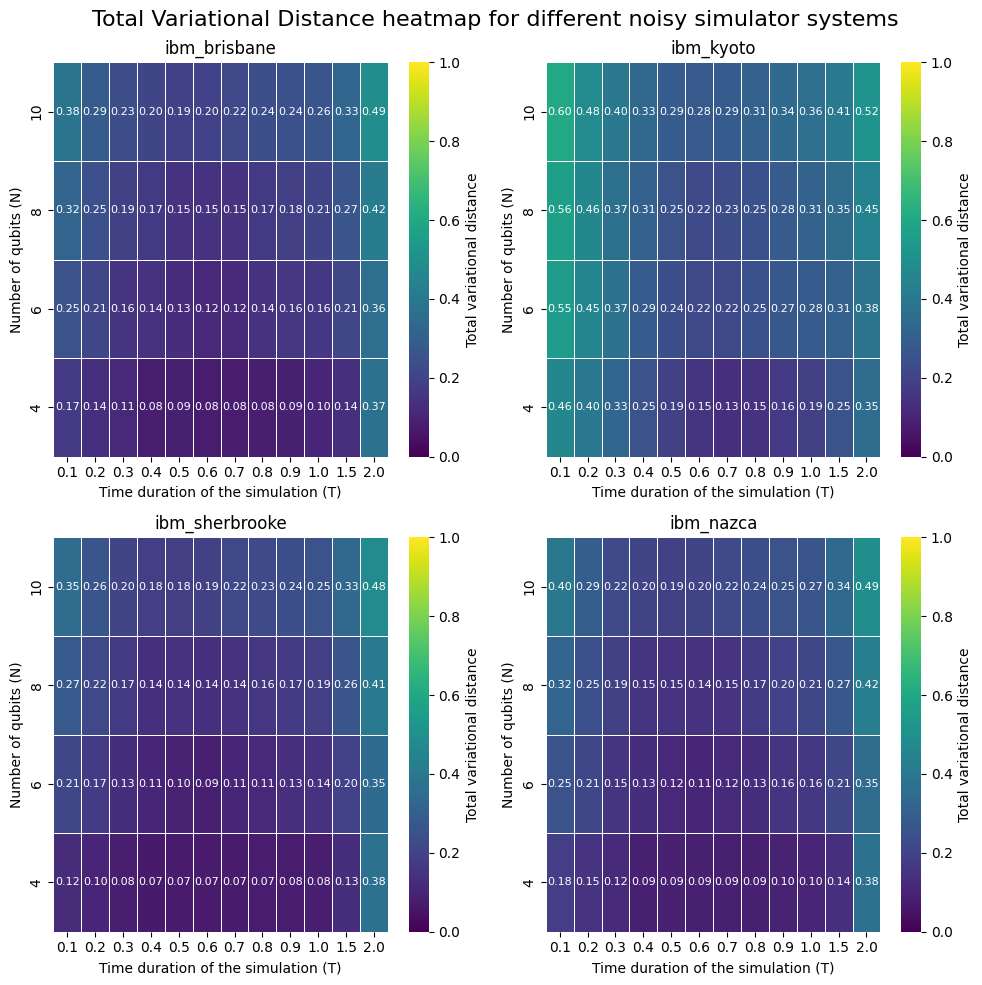

In [94]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    sns.heatmap(tv_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Total variational distance'}, 
                annot_kws={"size": 8}, ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Total Variational Distance heatmap for different noisy simulator systems', fontsize=16)
plt.tight_layout()
plt.show()

### Noise plot after ZNE mitigation

In [345]:
data = simulator_data_df

dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','ZNE HF','ZNE TV']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','ZNE HF','ZNE TV']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','ZNE HF','ZNE TV']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','ZNE HF','ZNE TV']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='ZNE HF').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='ZNE TV').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

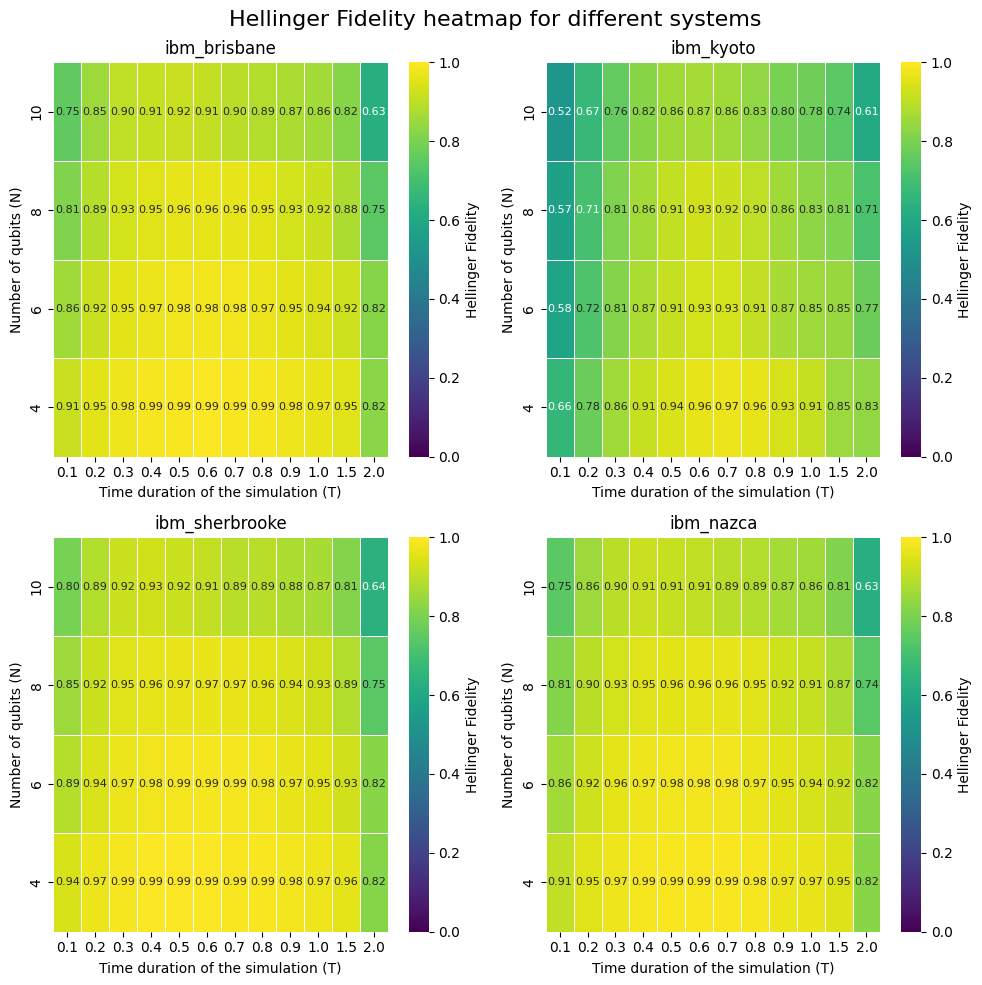

In [97]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    sns.heatmap(hf_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Hellinger Fidelity'}, 
                annot_kws={"size": 8}, 
                ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Hellinger Fidelity heatmap for different systems', fontsize=16)
plt.tight_layout()
plt.show()

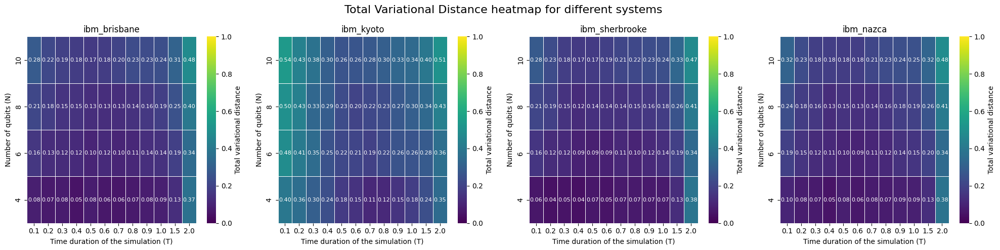

In [347]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes.flat):
    sns.heatmap(tv_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Total variational distance'}, 
                annot_kws={"size": 8}, ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Total Variational Distance heatmap for different systems', fontsize=16)
plt.tight_layout()
plt.show()

### Noise plot after FFZNE mitigation

In [354]:
data = simulator_data_df

dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','RBZNE HF','RBZNE TV']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','RBZNE HF','RBZNE TV']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','RBZNE HF','RBZNE TV']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','RBZNE HF','RBZNE TV']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='RBZNE HF').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='RBZNE TV').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

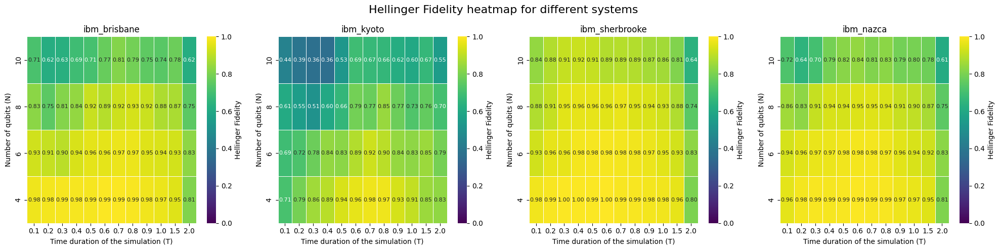

In [355]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes.flat):
    sns.heatmap(hf_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Hellinger Fidelity'}, 
                annot_kws={"size": 8}, 
                ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Hellinger Fidelity heatmap for different systems', fontsize=16)
plt.tight_layout()
plt.show()

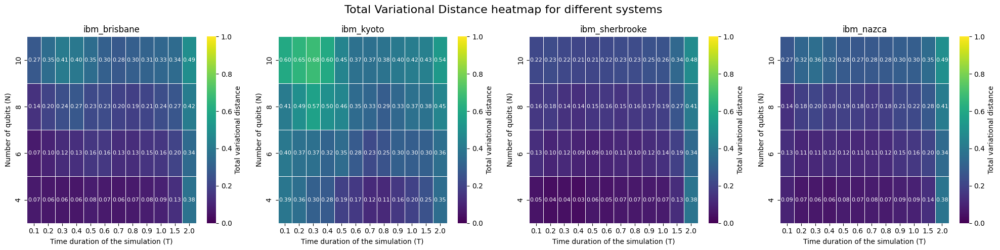

In [356]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes.flat):
    sns.heatmap(tv_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Total variational distance'}, 
                annot_kws={"size": 8}, ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Total Variational Distance heatmap for different systems', fontsize=16)
plt.tight_layout()
plt.show()

### Noise plot after RBZNE mitigation

In [357]:
data = simulator_data_df

dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','RBZNE HF','RBZNE TV']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','RBZNE HF','RBZNE TV']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','RBZNE HF','RBZNE TV']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','RBZNE HF','RBZNE TV']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='RBZNE HF').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='RBZNE TV').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

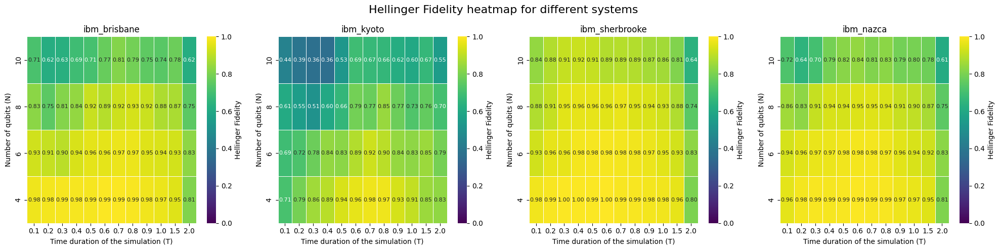

In [358]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes.flat):
    sns.heatmap(hf_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Hellinger Fidelity'}, 
                annot_kws={"size": 8}, 
                ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Hellinger Fidelity heatmap for different systems', fontsize=16)
plt.tight_layout()
plt.show()

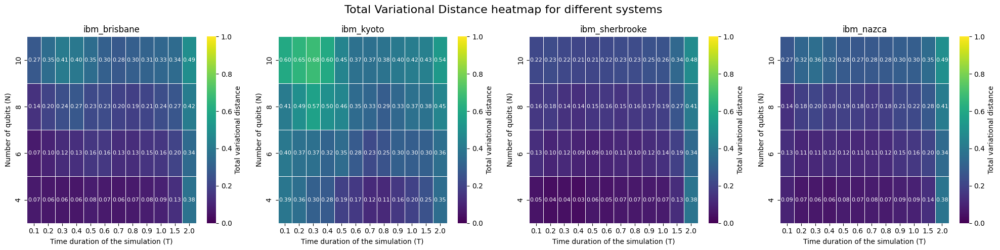

In [359]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

for i, ax in enumerate(axes.flat):
    sns.heatmap(tv_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Total variational distance'}, 
                annot_kws={"size": 8}, ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Total Variational Distance heatmap for different systems', fontsize=16)
plt.tight_layout()
plt.show()

### ZNE Percentage change

In [98]:
data = simulator_data_df

dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','ZNE HF % change','ZNE TV % change']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','ZNE HF % change','ZNE TV % change']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','ZNE HF % change','ZNE TV % change']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','ZNE HF % change','ZNE TV % change']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='ZNE HF % change').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='ZNE TV % change').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

In [99]:
hf_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,8.136232,4.489831,2.865512,1.545578,1.123173,0.976951,0.857344,0.758754,0.783000,1.092390,0.904751,1.166108
8,6.657343,3.488340,1.931299,1.316679,0.679922,0.466632,0.520024,0.679470,0.755530,0.884786,0.985267,1.530243
6,5.520573,2.569808,1.120202,0.523265,0.482731,0.256228,0.231418,0.434591,0.491605,0.446264,0.556211,0.849182
4,5.532040,3.337976,1.549032,0.462378,0.115305,0.361038,0.013752,0.402352,0.261974,0.401005,0.369503,-1.277205


In [100]:
tv_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,20.469586,21.852341,16.970174,8.150800,9.603199,9.891414,6.652644,4.578062,4.166325,6.515318,3.732563,1.691176
8,26.060026,27.564401,16.377341,17.054887,4.477434,8.315332,7.022193,8.296310,7.272272,7.856355,5.150342,3.372942
6,26.248449,28.571391,21.377422,13.993011,10.788876,10.632728,8.233920,10.870833,9.411081,6.078417,5.239214,1.850847
4,42.350178,46.056528,40.095121,41.218370,9.225037,25.542221,11.289938,16.081227,10.527712,13.825875,5.137841,-1.408333


### FFZNE Percentage change

In [101]:
data = simulator_data_df

dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','FFZNE HF % change','FFZNE TV % change']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','FFZNE HF % change','FFZNE TV % change']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','FFZNE HF % change','FFZNE TV % change']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','FFZNE HF % change','FFZNE TV % change']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='FFZNE HF % change').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='FFZNE TV % change').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

In [102]:
hf_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,7.179264,5.781219,4.668699,3.163105,2.137740,1.501679,1.492359,1.780926,1.994776,2.552609,1.865936,2.147023
8,3.444497,2.961369,2.535788,1.844716,1.570739,1.073317,1.049913,1.284414,1.596884,1.726009,1.837360,2.385741
6,2.512615,1.901939,1.341659,1.053028,0.836959,0.681536,0.575876,0.745504,0.989282,1.058479,1.316632,1.081058
4,4.896541,2.477077,1.347042,0.757699,0.375970,0.390448,0.301840,0.388063,0.352780,0.408672,0.686774,-0.691432


In [103]:
tv_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,12.009829,14.606395,23.340631,24.030547,19.100174,11.761752,10.467236,11.155587,13.470191,15.096604,7.337462,2.796878
8,8.616735,12.718743,17.678272,18.989801,20.400979,17.643636,17.579731,16.439442,17.285553,16.885252,9.358885,5.101752
6,10.350795,12.710010,17.127474,21.850744,21.255893,22.359093,17.543525,19.673022,17.818490,14.634448,11.323536,1.925078
4,33.200117,35.712530,38.004478,42.209148,20.683694,30.776431,19.898683,20.712950,14.304501,16.628047,10.999509,0.343593


### RBZNE Percentage Change

In [104]:
data = simulator_data_df

dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','RBZNE HF % change','RBZNE TV % change']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','RBZNE HF % change','RBZNE TV % change']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','RBZNE HF % change','RBZNE TV % change']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','RBZNE HF % change','RBZNE TV % change']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='RBZNE HF % change').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='RBZNE TV % change').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

In [105]:
hf_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,7.468516,5.766073,4.628343,3.188710,2.157259,1.502167,1.485172,1.766906,2.025991,2.544539,1.819651,2.122813
8,2.201208,2.471639,2.443432,1.830445,1.678039,1.119443,1.090353,1.353463,1.735828,1.859926,1.977979,2.527381
6,-0.644335,0.518957,0.775448,1.009708,0.814242,0.694760,0.617569,0.865521,1.232100,1.332384,1.580107,1.135557
4,2.671926,1.200541,0.063131,-0.047260,0.017812,0.149142,0.201766,0.234882,0.377108,0.428756,0.843723,-0.034421


In [106]:
tv_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,12.933371,14.990195,23.415282,25.531415,19.678722,11.911814,10.436718,10.916590,13.729745,14.998035,7.033662,2.773668
8,3.413108,7.928983,15.428883,16.685466,20.691047,18.377266,18.454886,17.935768,19.499916,18.743065,10.000691,5.404270
6,-4.107298,-0.245065,5.097736,16.553301,18.367219,20.010906,19.650333,23.693976,22.999200,18.656844,13.266581,1.857534
4,16.822224,18.164581,23.158343,12.930477,15.972259,20.881506,19.246366,20.262613,16.254365,18.518131,12.906986,2.047847


## Comparative Study

### Line plots for values

In [38]:
import matplotlib.pyplot as plt

def simulator_plot_hf_for_system(system, data):
    x_values = list(data['T'].unique())
    y_values = []

    line_mapping = ['Noise free Baseline','Noise Baseline', 'ZNE HF', 'FFZNE HF', 'RBZNE HF']

    for N in [4,6,8,10]:
        noise_free_hf = data[(data['System'] == system) & (data['N'] == N)]['Without Noise HF']
        hf = data[(data['System'] == system) & (data['N'] == N)]['Noise HF']
        zne_hf = data[(data['System'] == system) & (data['N'] == N)]['ZNE HF']
        ffzne_hf = data[(data['System'] == system) & (data['N'] == N)]['FFZNE HF']
        rbzne_hf = data[(data['System'] == system) & (data['N'] == N)]['RBZNE HF']
        y_values.append([noise_free_hf,hf, zne_hf, ffzne_hf, rbzne_hf])

    # Create a 2x2 grid of multi-line plots
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            idx = i * 2 + j
            for line_num, y_data in enumerate(y_values[idx]):
                ax.plot(x_values, y_data, marker='o', linestyle='-', label=f'{line_mapping[line_num]}')
            ax.set_xlabel('Time duration of the simulation (T)')
            ax.set_ylabel('Hellinger fidelity')
            ax.set_title(f'N = {idx*2 + 4}')
            ax.grid(True)
            ax.legend()

    plt.suptitle(f'Hellinger fidelity for {system} noisy simulator for different N and methods', fontsize=16)
    plt.tight_layout()
    plt.show()

def simulator_plot_tv_for_system(system,data):
    x_values = list(data['T'].unique())
    y_values = []

    line_mapping = ['Noise free Baseline','Noise Baseline', 'ZNE TV', 'FFZNE TV', 'RBZNE TV']

    for N in [4,6,8,10]:
        noise_free_tv = data[(data['System'] == system) & (data['N'] == N)]['Without Noise TV']
        tv = data[(data['System'] == system) & (data['N'] == N)]['Noise TV']
        zne_tv = data[(data['System'] == system) & (data['N'] == N)]['ZNE TV']
        ffzne_tv = data[(data['System'] == system) & (data['N'] == N)]['FFZNE TV']
        rbzne_tv = data[(data['System'] == system) & (data['N'] == N)]['RBZNE TV']
        y_values.append([noise_free_tv, tv, zne_tv, ffzne_tv, rbzne_tv])

    # Create a 2x2 grid of multi-line plots
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            idx = i * 2 + j
            for line_num, y_data in enumerate(y_values[idx]):
                ax.plot(x_values, y_data, marker='o', linestyle='-', label=f'{line_mapping[line_num]}')
            ax.set_xlabel('Time duration of the simulation (T)')
            ax.set_ylabel('Total variational distance')
            ax.set_title(f'N = {idx*2 + 4}')
            ax.grid(True)
            ax.legend()

    plt.suptitle(f'Total variational distance for {system} noisy simulator for different N and methods', fontsize=16)
    plt.tight_layout()
    plt.show()

def simulator_plot_hf_percentage_change_for_system(system, data):
    x_values = list(data['T'].unique())
    y_values = []

    line_mapping = ['ZNE HF % change', 'FFZNE HF % change', 'RBZNE HF % change']

    for N in [4,6,8,10]:
        zne_hf = data[(data['System'] == system) & (data['N'] == N)]['ZNE HF % change']
        ffzne_hf = data[(data['System'] == system) & (data['N'] == N)]['FFZNE HF % change']
        rbzne_hf = data[(data['System'] == system) & (data['N'] == N)]['RBZNE HF % change']
        y_values.append([zne_hf, ffzne_hf, rbzne_hf])

    # Create a 2x2 grid of multi-line plots
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            idx = i * 2 + j
            for line_num, y_data in enumerate(y_values[idx]):
                ax.plot(x_values, y_data, marker='o', linestyle='-', label=f'{line_mapping[line_num]}')
            ax.axhline(y=0, color='red', linestyle='--', label='Baseline')
            ax.set_xlabel('Time duration of the simulation (T)')
            ax.set_ylabel('Hellinger fidelity % change')
            ax.set_title(f'N = {idx*2 + 4}')
            ax.grid(True)
            ax.legend()

    plt.suptitle(f'Hellinger fidelity % change for {system} noisy simulator for different N and methods', fontsize=16)
    plt.tight_layout()
    plt.show()

def simulator_plot_tv_percentage_change_for_system(system,data):
    x_values = list(data['T'].unique())
    y_values = []

    line_mapping = ['ZNE TV % change', 'FFZNE TV % change', 'RBZNE TV % change']

    for N in [4,6,8,10]:
        zne_tv = data[(data['System'] == system) & (data['N'] == N)]['ZNE TV % change']
        ffzne_tv = data[(data['System'] == system) & (data['N'] == N)]['FFZNE TV % change']
        rbzne_tv = data[(data['System'] == system) & (data['N'] == N)]['RBZNE TV % change']
        y_values.append([zne_tv, ffzne_tv, rbzne_tv])

    # Create a 2x2 grid of multi-line plots
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            idx = i * 2 + j
            for line_num, y_data in enumerate(y_values[idx]):
                ax.plot(x_values, y_data, marker='o', linestyle='-', label=f'{line_mapping[line_num]}')
            ax.axhline(y=0, color='red', linestyle='--', label='Baseline')
            ax.set_xlabel('Time duration of the simulation (T)')
            ax.set_ylabel('Total variational distance % change')
            ax.set_title(f'N = {idx*2 + 4}')
            ax.grid(True)
            ax.legend()

    plt.suptitle(f'Total variational distance % change for {system} noisy simulator for different N and methods', fontsize=16)
    plt.tight_layout()
    plt.show()

#### Hellinger Fidelity

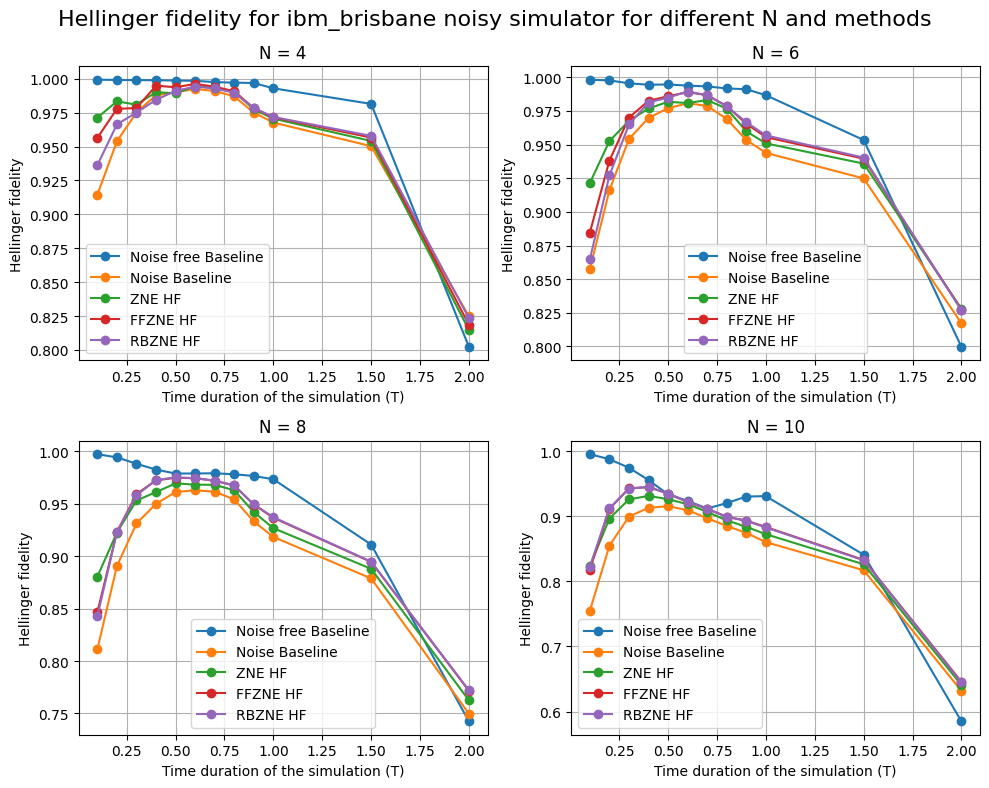

In [28]:
simulator_plot_hf_for_system('ibm_brisbane', simulator_data_df)

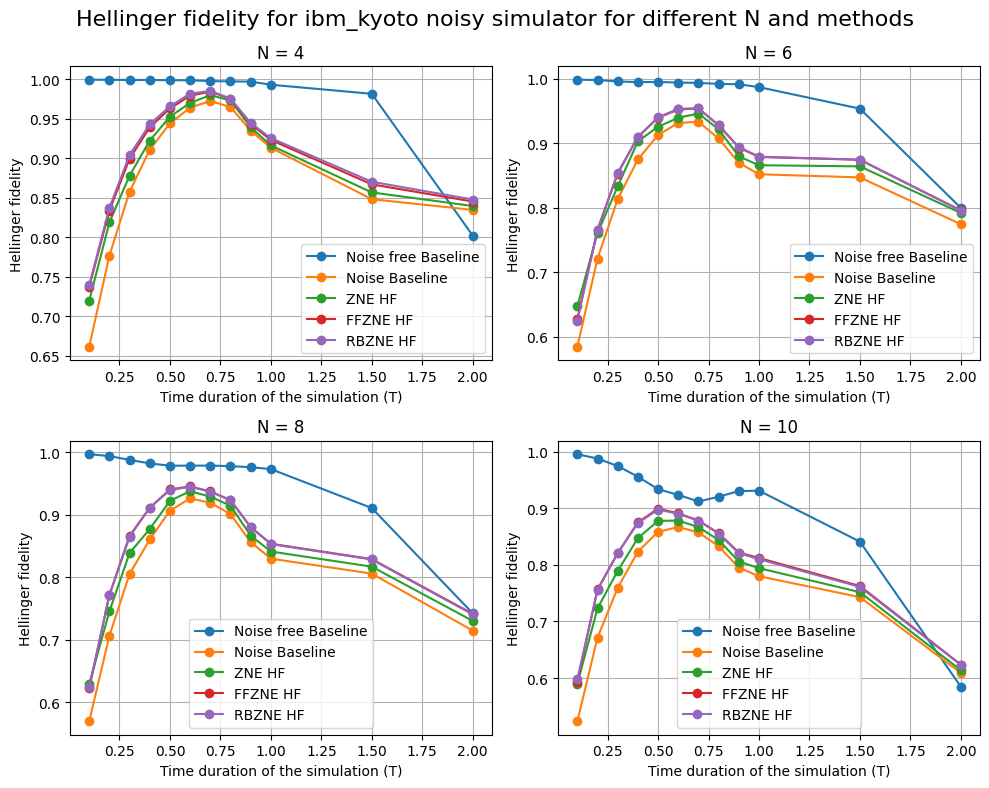

In [30]:
simulator_plot_hf_for_system('ibm_kyoto', simulator_data_df)

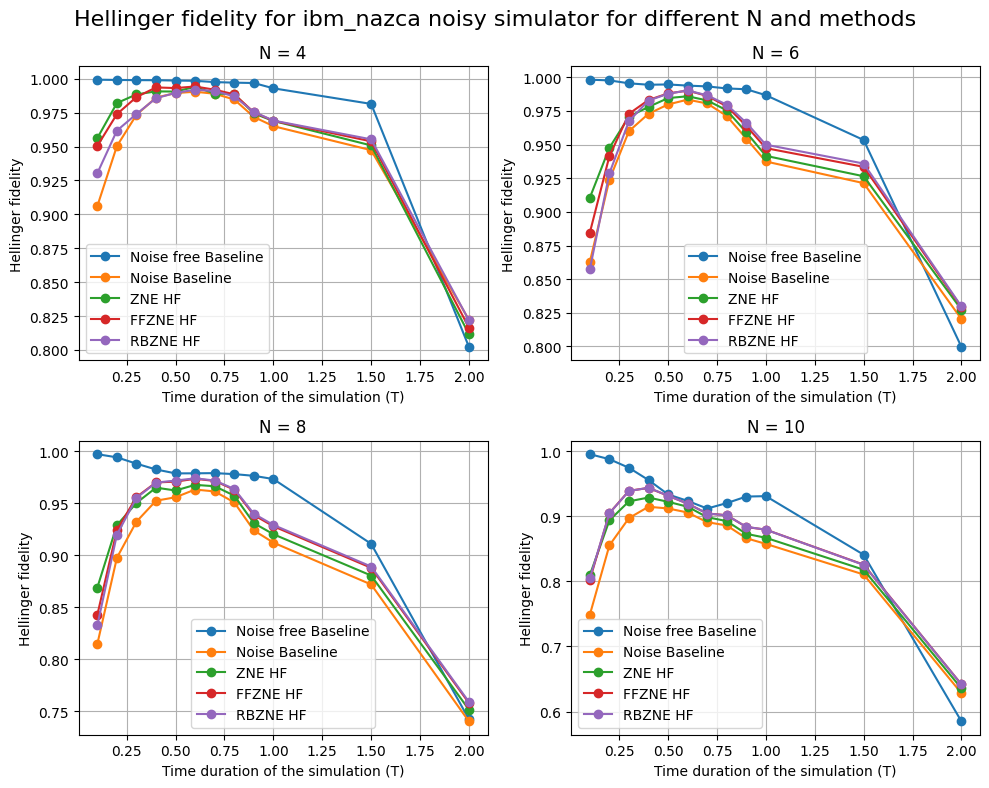

In [29]:
simulator_plot_hf_for_system('ibm_nazca', simulator_data_df)

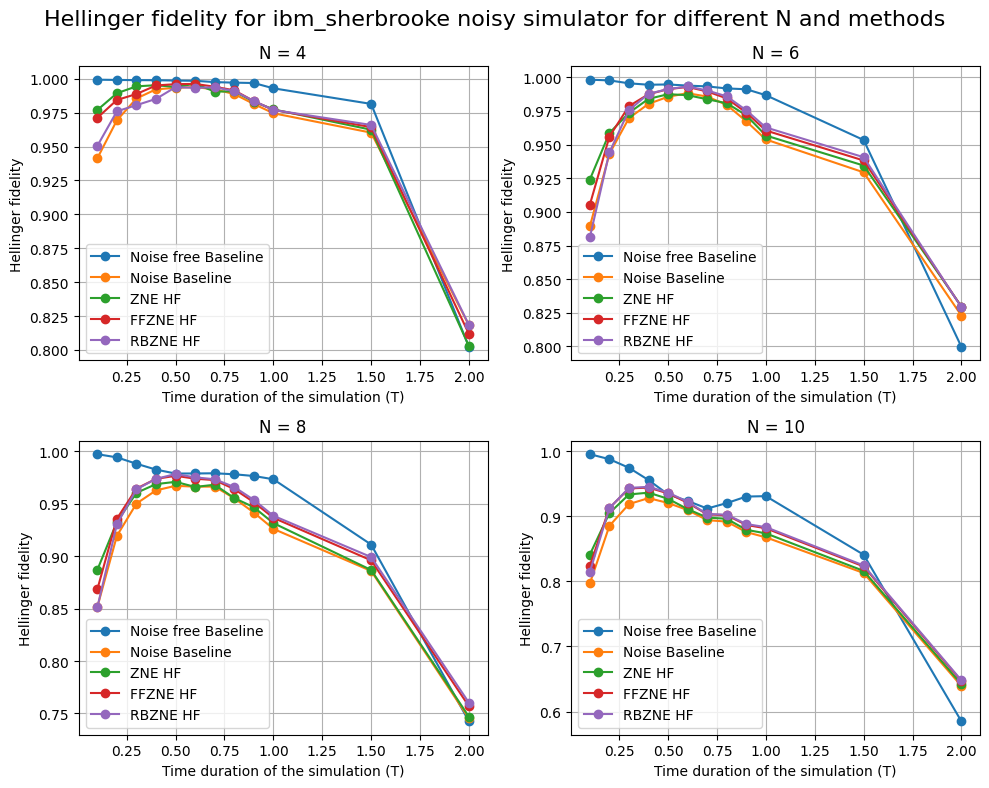

In [32]:
simulator_plot_hf_for_system('ibm_sherbrooke', simulator_data_df)

#### Total Variational Distance

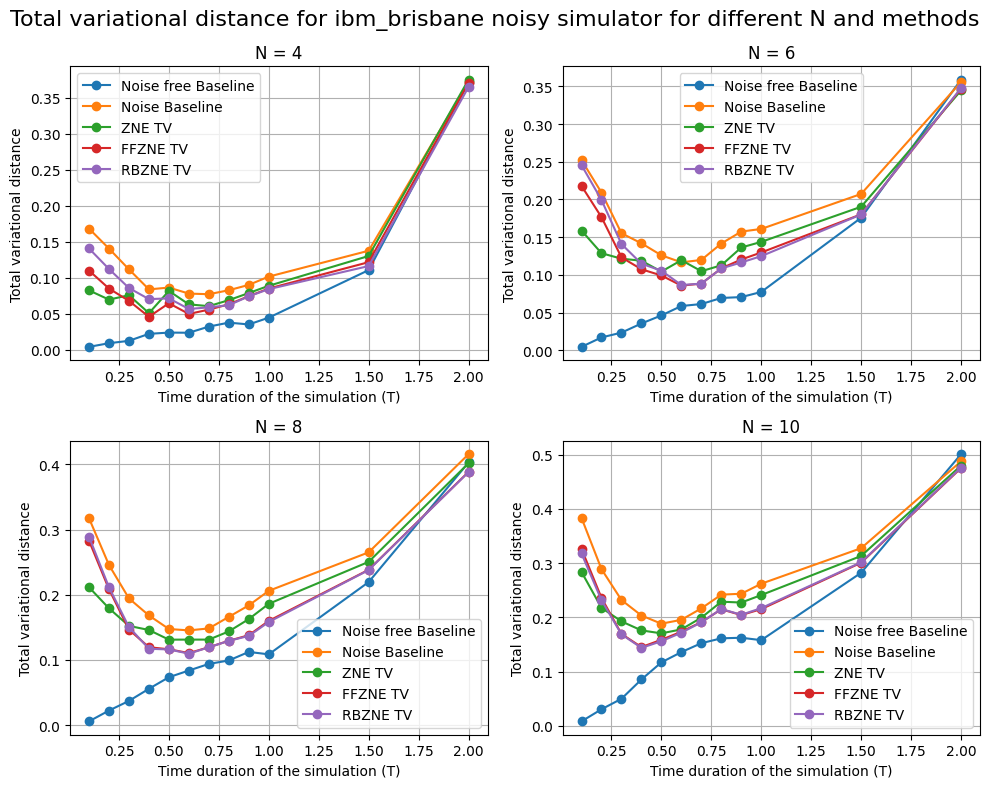

In [31]:
simulator_plot_tv_for_system('ibm_brisbane', simulator_data_df)

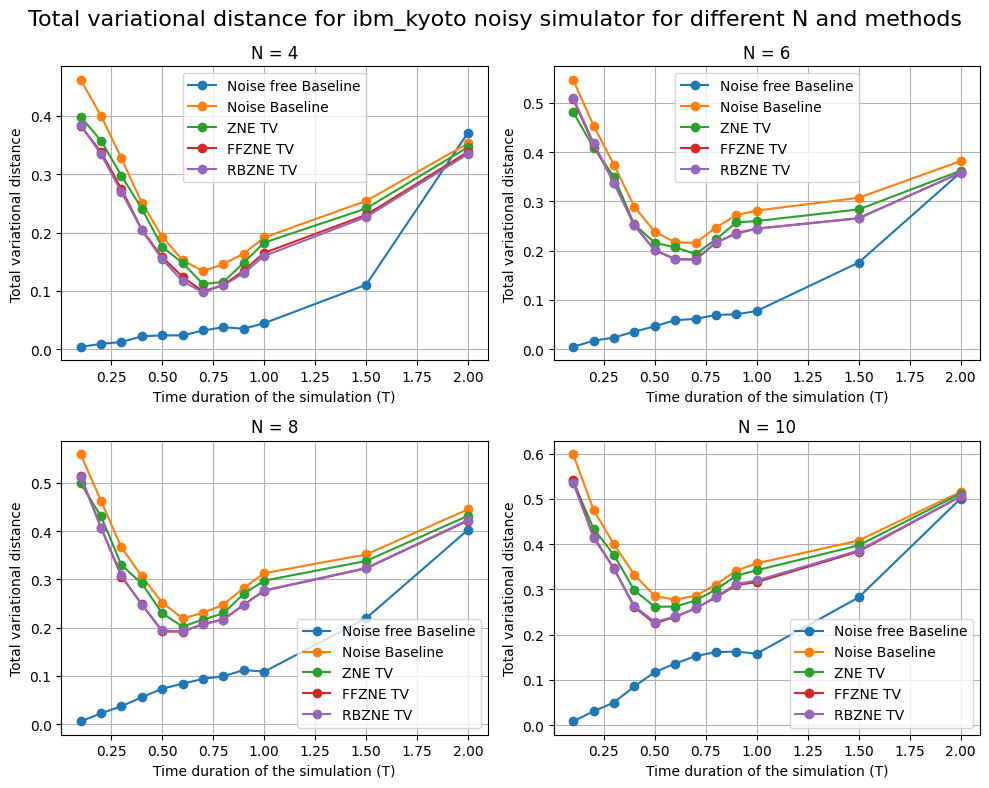

In [33]:
simulator_plot_tv_for_system('ibm_kyoto', simulator_data_df)

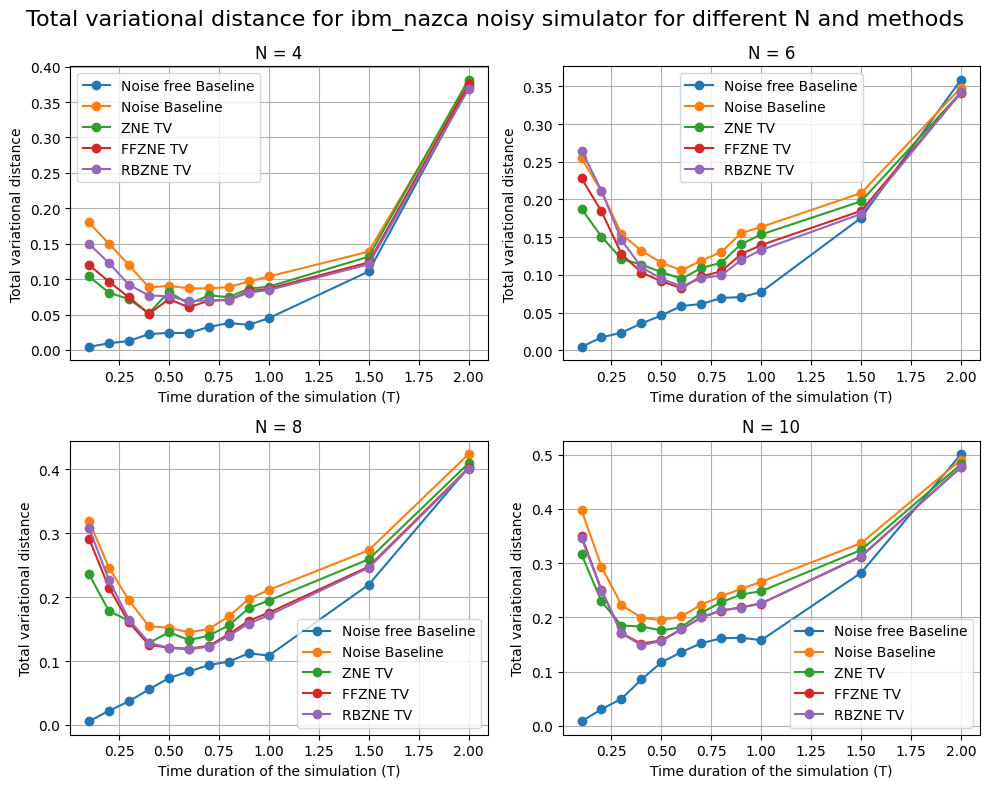

In [34]:
simulator_plot_tv_for_system('ibm_nazca', simulator_data_df)

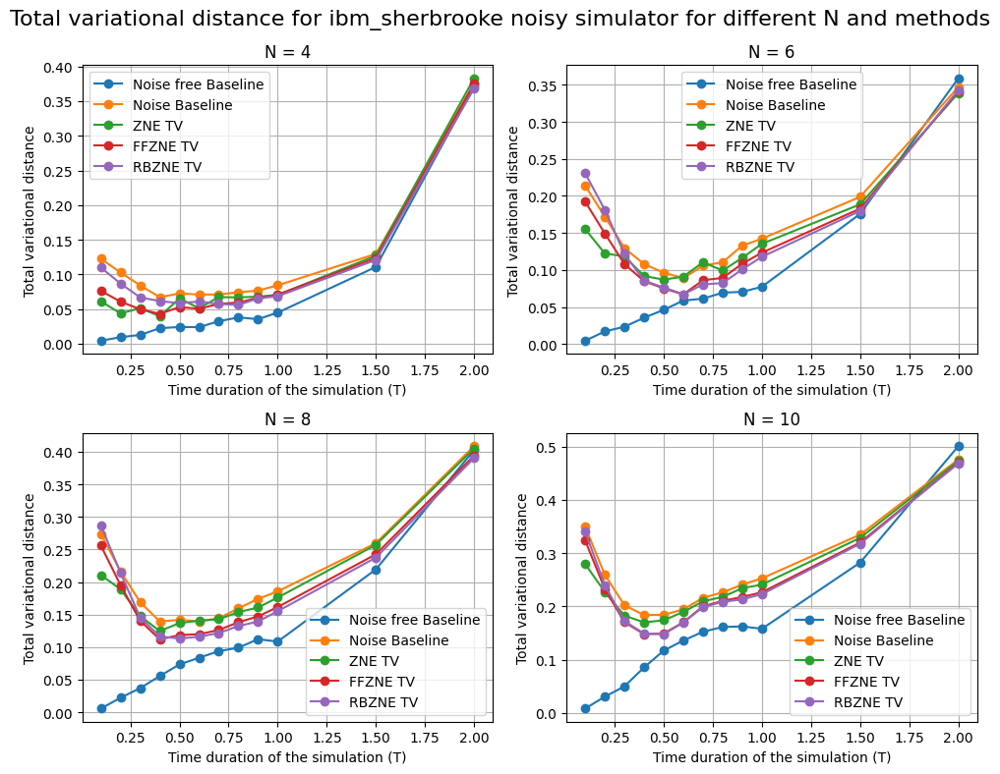

In [35]:
simulator_plot_tv_for_system('ibm_sherbrooke', simulator_data_df)

#### Hellinger percentage change

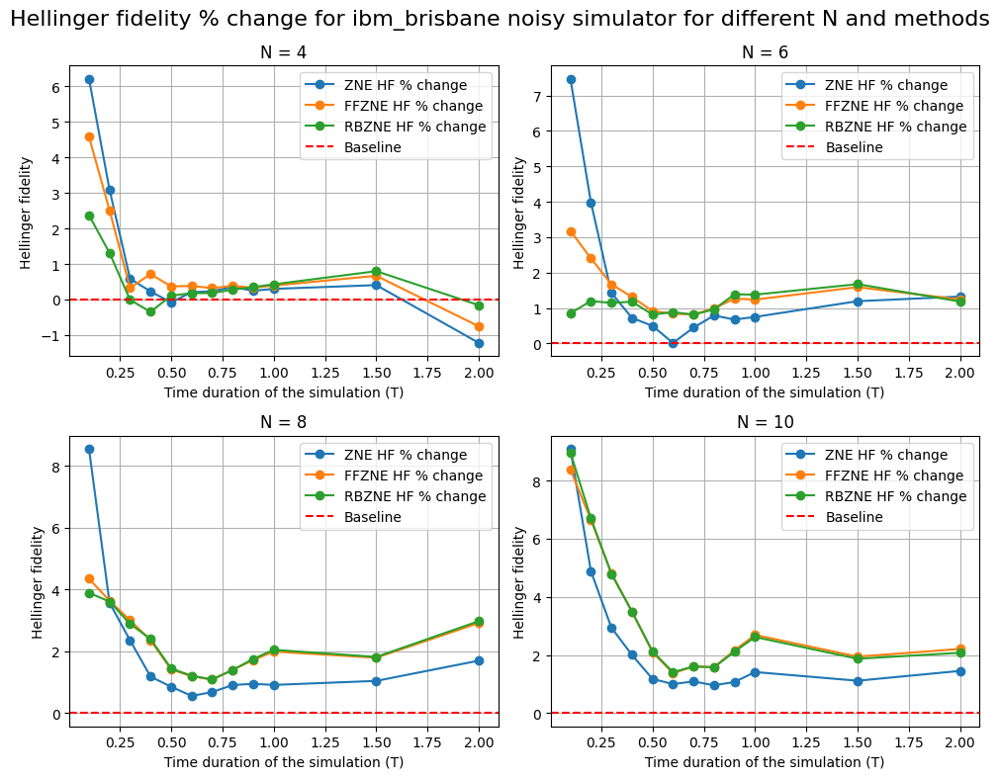

In [36]:
simulator_plot_hf_percentage_change_for_system('ibm_brisbane', simulator_data_df)

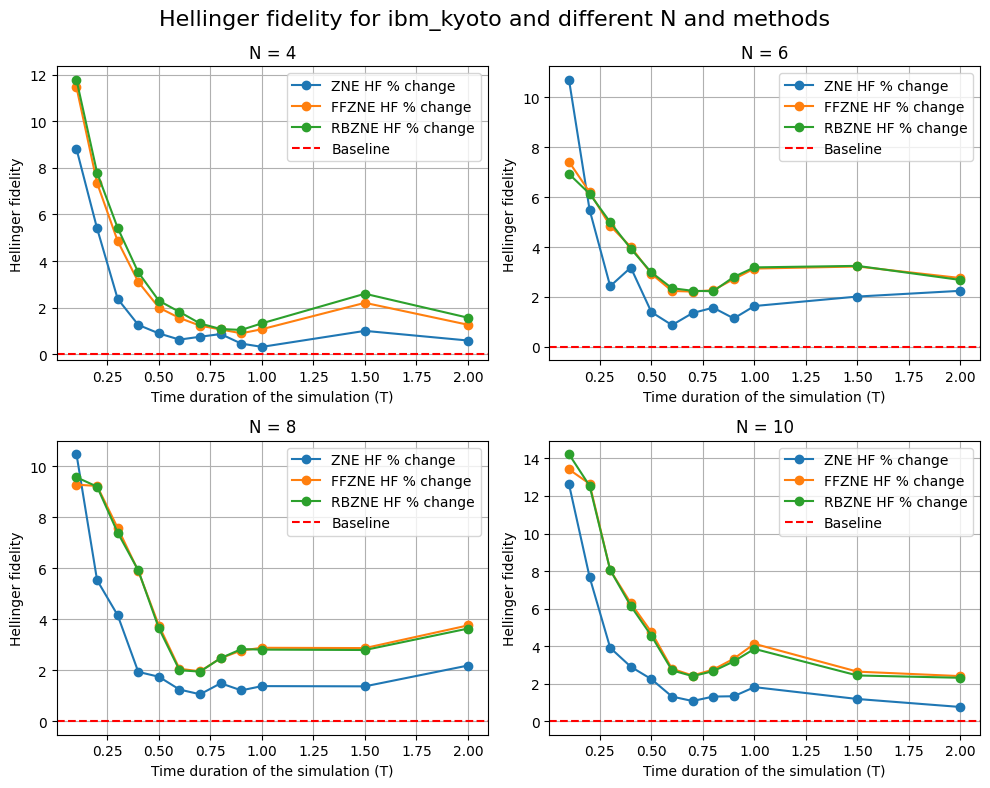

In [484]:
simulator_plot_hf_percentage_change_for_system('ibm_kyoto', simulator_data_df)

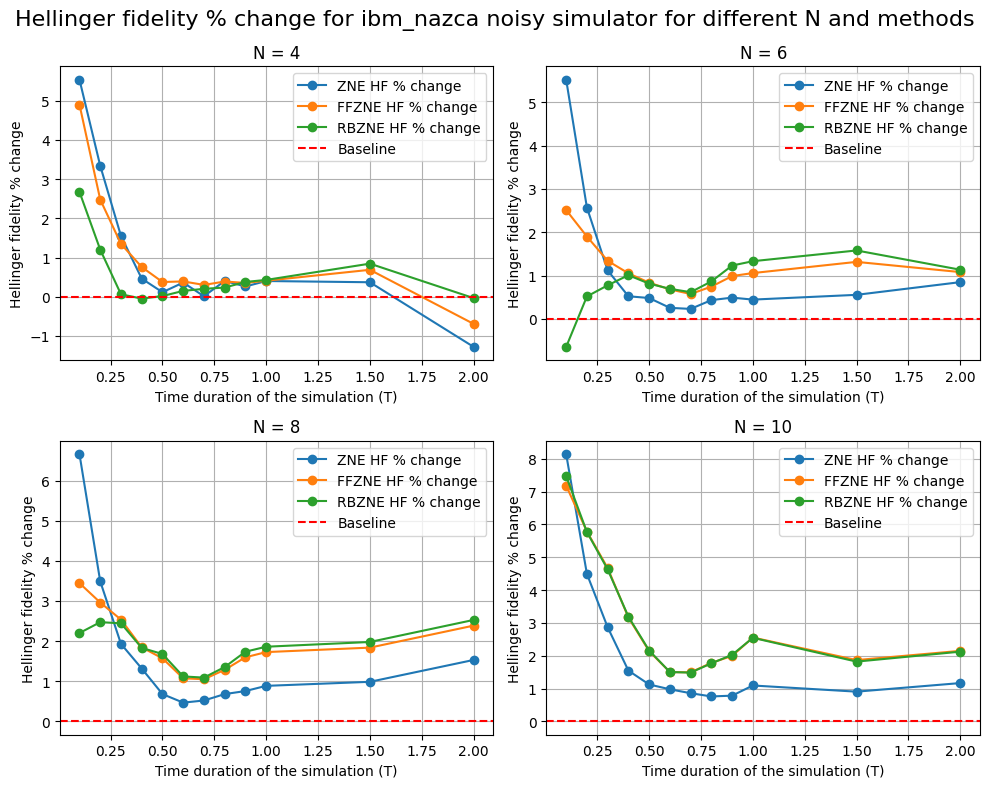

In [39]:
simulator_plot_hf_percentage_change_for_system('ibm_nazca', simulator_data_df)

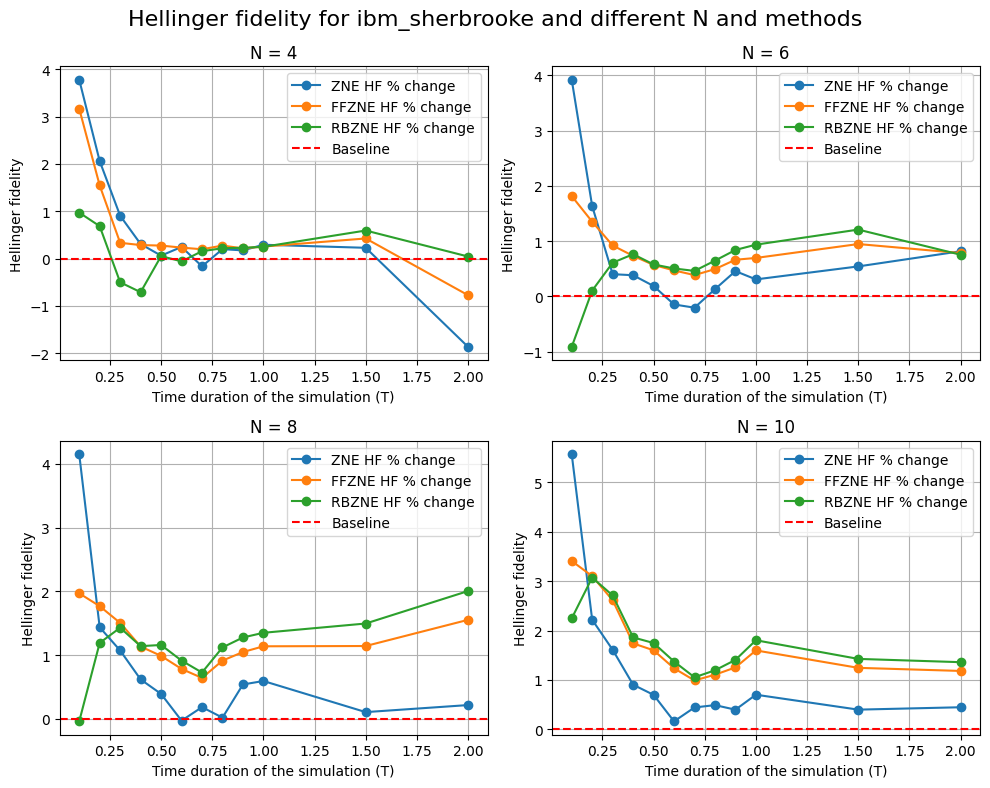

In [486]:
simulator_plot_hf_percentage_change_for_system('ibm_sherbrooke', simulator_data_df)

#### Total Variational Distance Percentage Change

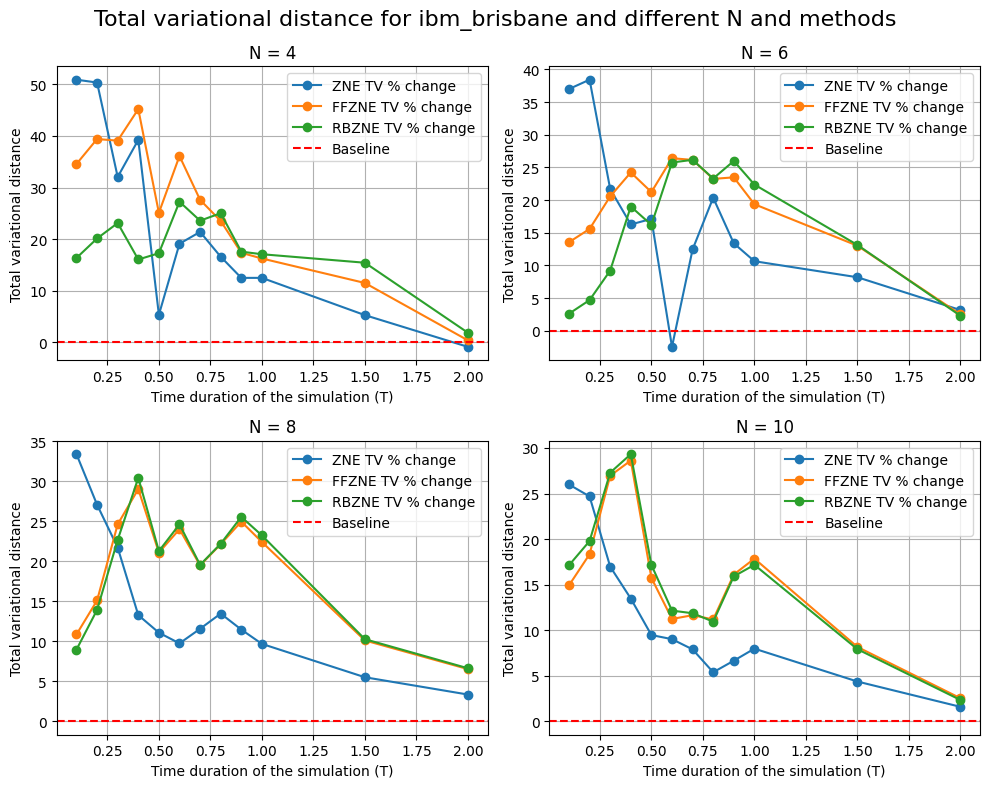

In [487]:
simulator_plot_tv_percentage_change_for_system('ibm_brisbane', simulator_data_df)

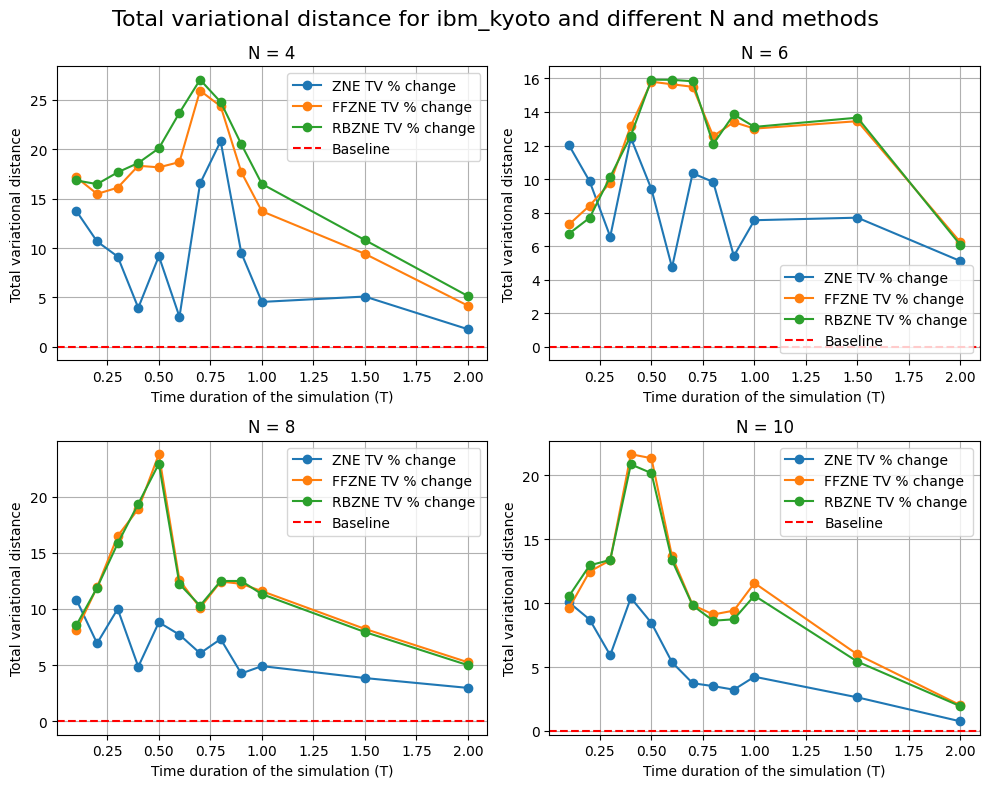

In [488]:
simulator_plot_tv_percentage_change_for_system('ibm_kyoto', simulator_data_df)

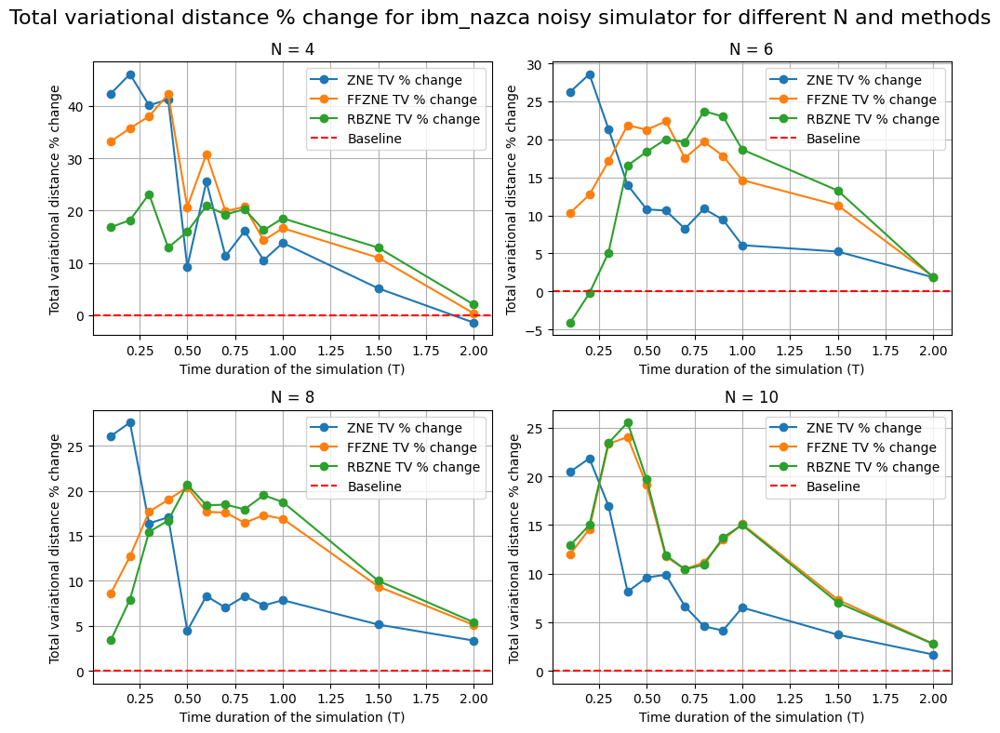

In [40]:
simulator_plot_tv_percentage_change_for_system('ibm_nazca', simulator_data_df)

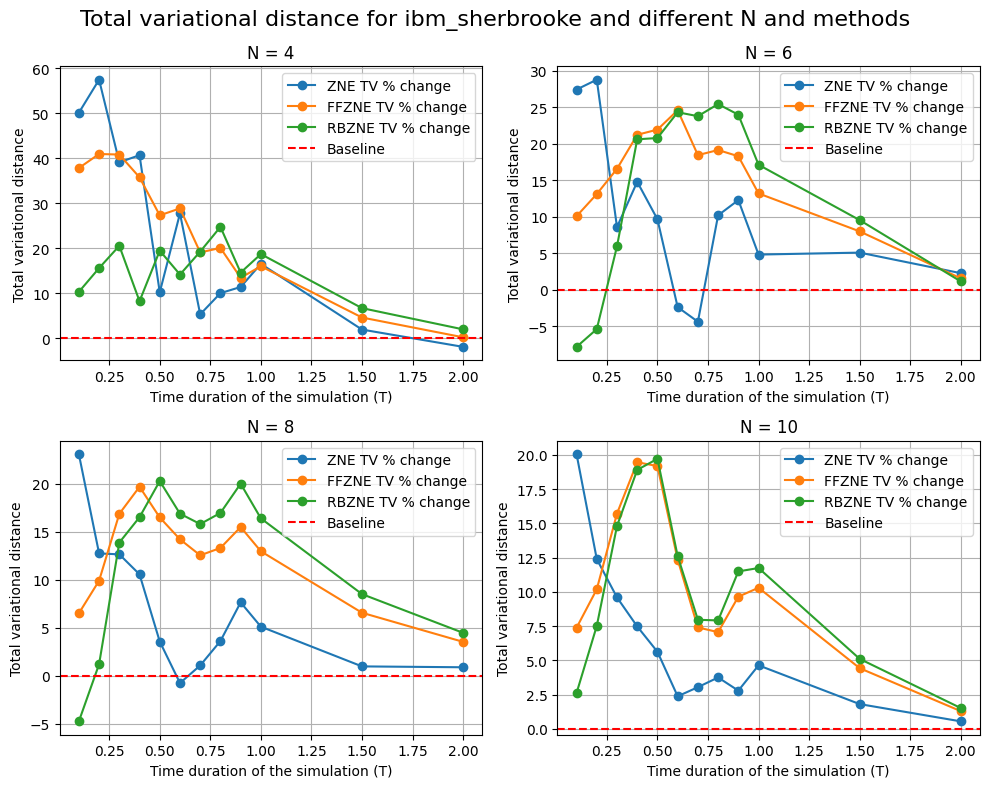

In [490]:
simulator_plot_tv_percentage_change_for_system('ibm_sherbrooke', simulator_data_df)

### Geometric mean

#### Geometric mean for each system and N

In [491]:
def get_geometric_means_for_system_and_N(system, data, dist):
    # Calculate the geometric mean for each N
    zne_geometric_means = list(map(lambda x: np.prod(1 + x/100)**(1/len(x)), [data[(data['System'] == system) & (data['N'] == 4)][f'ZNE {dist} % change'],
                                                                              data[(data['System'] == system) & (data['N'] == 6)][f'ZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 8)][f'ZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 10)][f'ZNE {dist} % change']]))

    ffzne_geomtric_means = list(map(lambda x: np.prod(1 + x/100)**(1/len(x)), [data[(data['System'] == system) & (data['N'] == 4)][f'FFZNE {dist} % change'],
                                                                              data[(data['System'] == system) & (data['N'] == 6)][f'FFZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 8)][f'FFZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 10)][f'FFZNE {dist} % change']]))

    rbzne_geometric_means = list(map(lambda x: np.prod(1 + x/100)**(1/len(x)), [data[(data['System'] == system) & (data['N'] == 4)][f'RBZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 6)][f'RBZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 8)][f'RBZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 10)][f'RBZNE {dist} % change']]))

    return [zne_geometric_means, ffzne_geomtric_means, rbzne_geometric_means]

##### Hellinger Fidelity

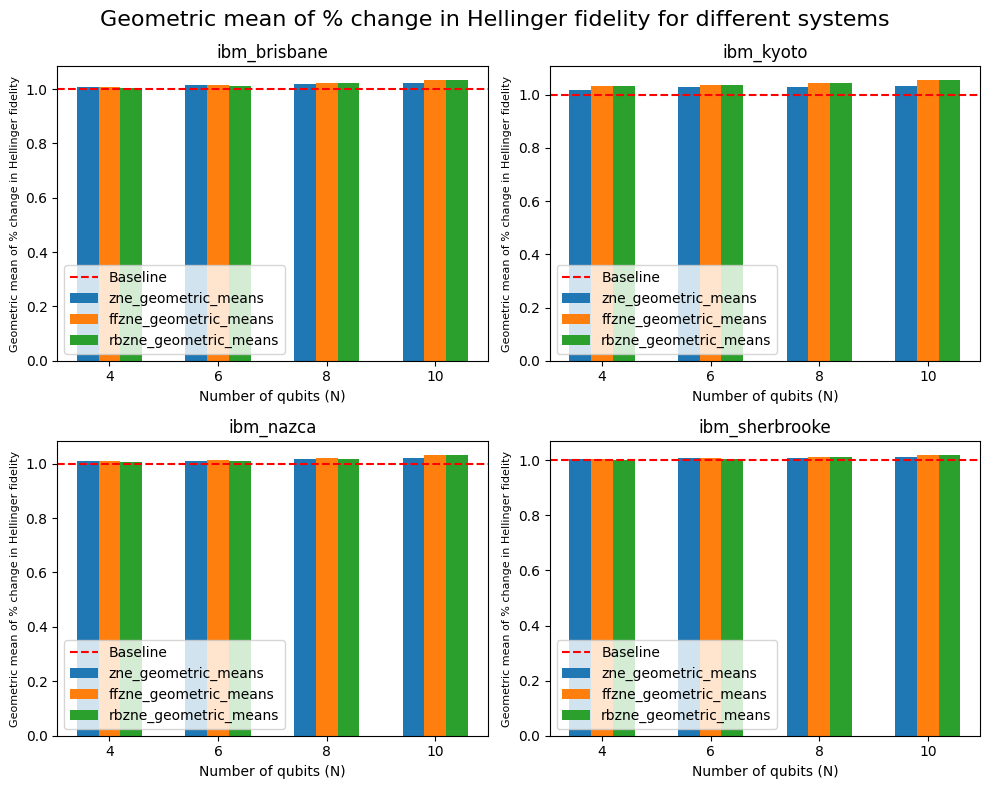

In [492]:
import matplotlib.pyplot as plt
import numpy as np

data = simulator_data_df

# Sample data
categories = [4,6,8,10]
ibm_brisbane_means = get_geometric_means_for_system_and_N('ibm_brisbane', data,'HF')
ibm_kyoto_means = get_geometric_means_for_system_and_N('ibm_kyoto', data,'HF')
ibm_nazca_means = get_geometric_means_for_system_and_N('ibm_nazca', data,'HF')
ibm_sherbrooke_means = get_geometric_means_for_system_and_N('ibm_sherbrooke', data,'HF')

# Define the width of the bars
bar_width = 0.2

# Set the position of the bars on the x-axis
x = np.arange(len(categories))

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Flatten the axes array to iterate over it
axes = axes.flatten()

group_labels = ['zne_geometric_means', 'ffzne_geometric_means', 'rbzne_geometric_means']
plot_labels = ['ibm_brisbane', 'ibm_kyoto', 'ibm_nazca', 'ibm_sherbrooke']   

# Plot each multi-bar graph in a subplot
for i, ax in enumerate(axes):
    if i == 0:
        values = ibm_brisbane_means

    elif i == 1:
        values = ibm_kyoto_means

    elif i == 2:
        values = ibm_nazca_means

    else:
        values = ibm_sherbrooke_means

        
    for j, v in enumerate(values):
        ax.bar(x + j * bar_width, v, width=bar_width, label=f'{group_labels[j]}')
        
    ax.set_xlabel('Number of qubits (N)')
    ax.set_ylabel('Geometric mean of % change in Hellinger fidelity', fontsize=8)
    ax.set_title(f'{plot_labels[i]}')
    ax.set_xticks(x + bar_width / 2 * (len(values) - 1))
    ax.set_xticklabels(categories)
    
    # Draw a horizontal line at y=1
    ax.axhline(y=1, color='red', linestyle='--', label='Baseline')
    ax.legend()

plt.suptitle('Geometric mean of % change in Hellinger fidelity for different systems', fontsize=16)
plt.tight_layout()
plt.show()


##### Total Variational Distance

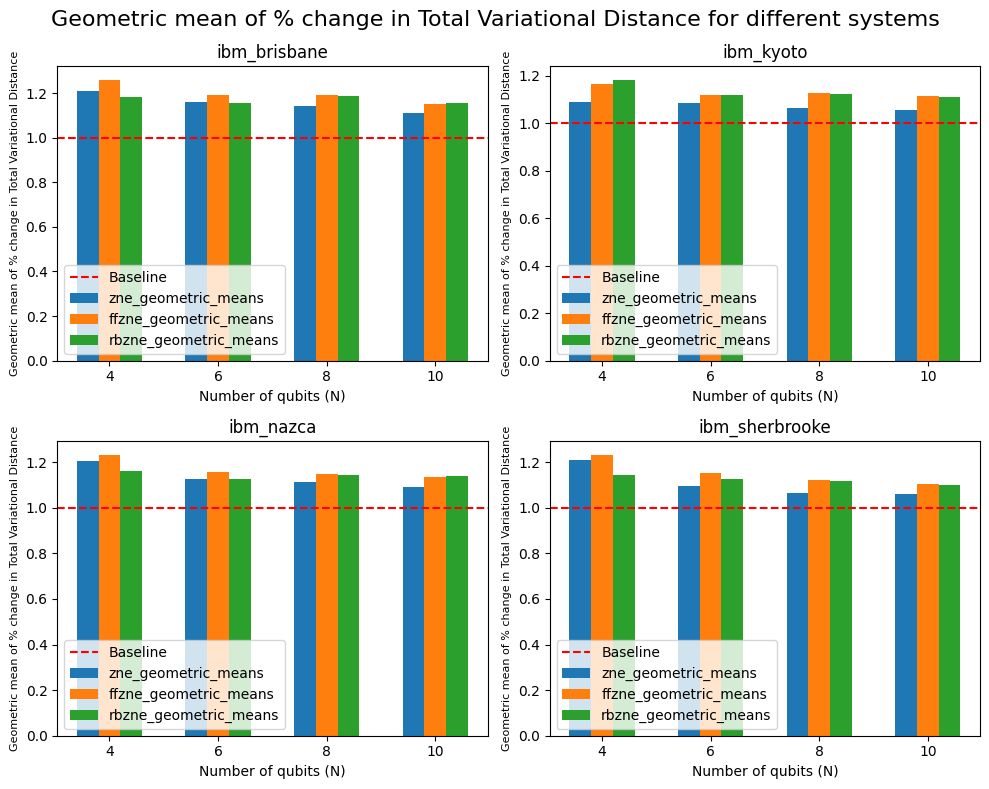

In [493]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
categories = [4,6,8,10]
ibm_brisbane_means = get_geometric_means_for_system_and_N('ibm_brisbane', data,'TV')
ibm_kyoto_means = get_geometric_means_for_system_and_N('ibm_kyoto', data,'TV')
ibm_nazca_means = get_geometric_means_for_system_and_N('ibm_nazca', data,'TV')
ibm_sherbrooke_means = get_geometric_means_for_system_and_N('ibm_sherbrooke', data,'TV')

# Define the width of the bars
bar_width = 0.2

# Set the position of the bars on the x-axis
x = np.arange(len(categories))

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Flatten the axes array to iterate over it
axes = axes.flatten()

group_labels = ['zne_geometric_means', 'ffzne_geometric_means', 'rbzne_geometric_means']
plot_labels = ['ibm_brisbane', 'ibm_kyoto', 'ibm_nazca', 'ibm_sherbrooke']   

# Plot each multi-bar graph in a subplot
for i, ax in enumerate(axes):
    if i == 0:
        values = ibm_brisbane_means

    elif i == 1:
        values = ibm_kyoto_means

    elif i == 2:
        values = ibm_nazca_means

    else:
        values = ibm_sherbrooke_means

        
    for j, v in enumerate(values):
        ax.bar(x + j * bar_width, v, width=bar_width, label=f'{group_labels[j]}')
        
    ax.set_xlabel('Number of qubits (N)')
    ax.set_ylabel('Geometric mean of % change in Total Variational Distance', fontsize=8)
    ax.set_title(f'{plot_labels[i]}')
    ax.set_xticks(x + bar_width / 2 * (len(values) - 1))
    ax.set_xticklabels(categories)
    
    # Draw a horizontal line at y=1
    ax.axhline(y=1, color='red', linestyle='--', label='Baseline')
    ax.legend()

plt.suptitle('Geometric mean of % change in Total Variational Distance for different systems', fontsize=16)
plt.tight_layout()
plt.show()


#### Geometric mean for each system

In [494]:
import matplotlib.pyplot as plt

def get_geometric_means_for_dist(dist, data):
    # Calculate the geometric mean for each N

    from functools import reduce
    
    # Calculate the geometric mean for records with system as ibm_brisbane
    brisbane_transformed = list(map(lambda x: 1 + x/100, data[data['System'] == 'ibm_brisbane'][dist]))
    brisbane_geometric_mean = reduce(lambda x, y: x*y, brisbane_transformed)**(1/len(brisbane_transformed))

    kyoto_transformed = list(map(lambda x: 1 + x/100, data[data['System'] == 'ibm_kyoto'][dist]))
    kyoto_geometric_mean = reduce(lambda x, y: x*y, kyoto_transformed)**(1/len(kyoto_transformed))

    nazca_transformed = list(map(lambda x: 1 + x/100, data[data['System'] == 'ibm_nazca'][dist]))
    nazca_geometric_mean = reduce(lambda x, y: x*y, nazca_transformed)**(1/len(nazca_transformed))

    sherbrooke_transformed = list(map(lambda x: 1 + x/100, data[data['System'] == 'ibm_sherbrooke'][dist]))
    sherbrooke_geometric_mean = reduce(lambda x, y: x*y, sherbrooke_transformed)**(1/len(sherbrooke_transformed))

    return [brisbane_geometric_mean, kyoto_geometric_mean, nazca_geometric_mean, sherbrooke_geometric_mean]

##### Hellinger fidelity

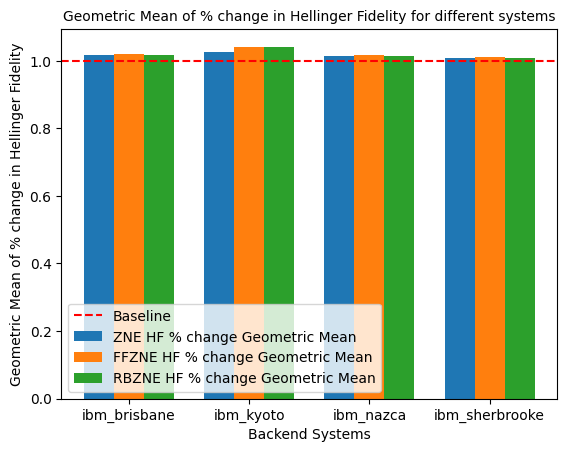

In [495]:
# Data
data = simulator_data_df

categories = ['ibm_brisbane', 'ibm_kyoto', 'ibm_nazca', 'ibm_sherbrooke']

zne_hf = get_geometric_means_for_dist('ZNE HF % change',data)  # Values for the first set of bars
ffzne_hf = get_geometric_means_for_dist('FFZNE HF % change',data)  # Values for the second set of bars
rbzne_hf = get_geometric_means_for_dist('RBZNE HF % change',data)  # Values for the third set of bars

# Bar width
bar_width = 0.25

# Positions for the bars
x = np.arange(len(categories))

# Plotting the bars
plt.bar(x, zne_hf, width=bar_width, label='ZNE HF % change Geometric Mean')
plt.bar(x + bar_width, ffzne_hf, width=bar_width, label='FFZNE HF % change Geometric Mean')
plt.bar(x + 2 * bar_width, rbzne_hf, width=bar_width, label='RBZNE HF % change Geometric Mean')

# Draw a horizontal line at y=1
plt.axhline(y=1, color='red', linestyle='--', label='Baseline')

# Adding labels and title
plt.xlabel('Backend Systems')
plt.ylabel('Geometric Mean of % change in Hellinger Fidelity')
plt.title('Geometric Mean of % change in Hellinger Fidelity for different systems', fontsize=10)
plt.xticks(x + bar_width, categories)
plt.legend()

# Show plot
plt.show()


##### Total Variational Distance

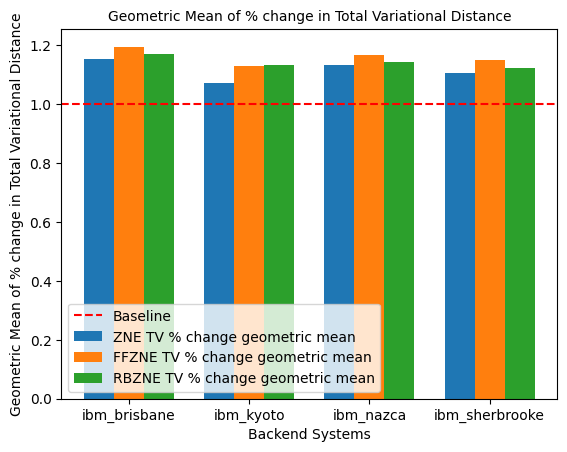

In [496]:
zne_tv = get_geometric_means_for_dist('ZNE TV % change',data)  # Values for the first set of bars
ffzne_tv = get_geometric_means_for_dist('FFZNE TV % change',data)  # Values for the second set of bars
rbzne_tv = get_geometric_means_for_dist('RBZNE TV % change',data)  # Values for the third set of bars

# Bar width
bar_width = 0.25

# Positions for the bars
x = np.arange(len(categories))

# Plotting the bars
plt.bar(x, zne_tv, width=bar_width, label='ZNE TV % change geometric mean')
plt.bar(x + bar_width, ffzne_tv, width=bar_width, label='FFZNE TV % change geometric mean')
plt.bar(x + 2 * bar_width, rbzne_tv, width=bar_width, label='RBZNE TV % change geometric mean')

# Draw a horizontal line at y=1
plt.axhline(y=1, color='red', linestyle='--', label='Baseline')

# Adding labels and title
plt.xlabel('Backend Systems')
plt.ylabel('Geometric Mean of % change in Total Variational Distance')
plt.title('Geometric Mean of % change in Total Variational Distance', fontsize=10)
plt.xticks(x + bar_width, categories)
plt.legend()

# Show plot
plt.show()


#### Geometric mean for each method

In [497]:
from functools import reduce

data = simulator_data_df

def get_geometric_mean_for_method(data,dist):

    hf_transformed = list(map(lambda x: 1 + x/100, data[f'{dist} HF % change'])) 
    hf_geometric_mean = reduce(lambda x, y: x*y, hf_transformed)**(1/len(hf_transformed))

    tv_transformed = list(map(lambda x: 1 + x/100, data[f'{dist} TV % change']))
    tv_geometric_mean = reduce(lambda x, y: x*y, tv_transformed)**(1/len(tv_transformed))

    return [hf_geometric_mean, tv_geometric_mean]

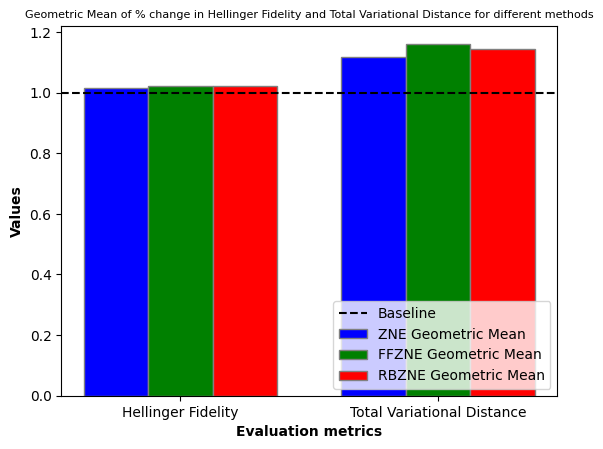

In [498]:
import matplotlib.pyplot as plt
import numpy as np

# Data
categories = ['Hellinger Fidelity', 'Total Variational Distance']
zne_means = get_geometric_mean_for_method(data,'ZNE')
ffzne_means = get_geometric_mean_for_method(data,'FFZNE')
rbzne_means = get_geometric_mean_for_method(data,'RBZNE')

# Set the width of the bars
bar_width = 0.25

# Set the positions of the bars on the x-axis
r1 = np.arange(len(categories))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

# Plotting the bars
plt.bar(r1, zne_means, color='b', width=bar_width, edgecolor='grey', label='ZNE Geometric Mean')
plt.bar(r2, ffzne_means, color='g', width=bar_width, edgecolor='grey', label='FFZNE Geometric Mean')
plt.bar(r3, rbzne_means, color='r', width=bar_width, edgecolor='grey', label='RBZNE Geometric Mean')

# Add horizontal lines at y=1
plt.axhline(y=1, color='black', linestyle='--', label='Baseline')

# Adding labels and title
plt.xlabel('Evaluation metrics', fontweight='bold')
plt.ylabel('Values', fontweight='bold')
plt.xticks([r + bar_width for r in range(len(categories))], categories)
plt.title('Geometric Mean of % change in Hellinger Fidelity and Total Variational Distance for different methods', fontsize=8)

# Adding legend
plt.legend(loc='lower right')

# Show plot
plt.show()


# Real Backend Results Analysis

## Setup

In [117]:
# Load the data
with open('Real hardware execution/summary_df.pkl', 'rb') as f:
    data = pickle.load(f)

In [118]:
data

,N,T,System,Noise HF,ZNE HF,ZNE HF % change,FFZNE HF,FFZNE HF % change,RBZNE HF,RBZNE HF % change,Noise TV,ZNE TV,ZNE TV % change,FFZNE TV,FFZNE TV % change,RBZNE TV,RBZNE TV % change
0,4,0.1,ibm_sherbrooke,0.790733,0.917069,15.977001,0.821314,3.867405,0.948006,19.889508,0.317739,0.135891,57.232022,0.279013,12.188207,0.111749,64.829815
1,4,0.2,ibm_sherbrooke,0.830387,0.945797,13.898383,0.854314,2.881439,0.943907,13.670777,0.324158,0.143490,55.734552,0.294627,9.110067,0.151438,53.282616
2,4,0.3,ibm_sherbrooke,0.857884,0.941039,9.693060,0.870262,1.442934,0.934038,8.877029,0.324210,0.164666,49.210004,0.307675,5.099953,0.165244,49.031693
3,4,0.4,ibm_sherbrooke,0.890558,0.950268,6.704785,0.894509,0.443696,0.946148,6.242172,0.295332,0.160282,45.728189,0.283350,4.057202,0.152898,48.228632
4,4,0.5,ibm_sherbrooke,0.899045,0.932427,3.713025,0.902789,0.416432,0.926332,3.035048,0.274893,0.172064,37.407053,0.269241,2.056244,0.188004,31.608399
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,10,0.8,ibm_nazca,0.578302,0.576564,-0.300486,0.569110,-1.589529,0.584209,1.021320,0.544895,0.548133,-0.594138,0.551467,-1.206131,0.541999,0.531565
188,10,0.9,ibm_nazca,0.558883,0.557871,-0.181071,0.537041,-3.908105,0.552353,-1.168291,0.549473,0.550084,-0.111146,0.563621,-2.574919,0.551497,-0.368425
189,10,1.0,ibm_nazca,0.546903,0.549548,0.483684,0.530297,-3.036209,0.536803,-1.846720,0.563828,0.560276,0.629957,0.577161,-2.364777,0.564567,-0.131047
190,10,1.5,ibm_nazca,0.651109,0.646076,-0.773013,0.642446,-1.330434,0.633555,-2.696039,0.448370,0.459856,-2.561866,0.467440,-4.253323,0.473263,-5.551902


## Noise plots

In [119]:
dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','Noise HF','Noise TV']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','Noise HF','Noise TV']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','Noise HF','Noise TV']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','Noise HF','Noise TV']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='Noise HF').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='Noise TV').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

### Hellinger fidelity

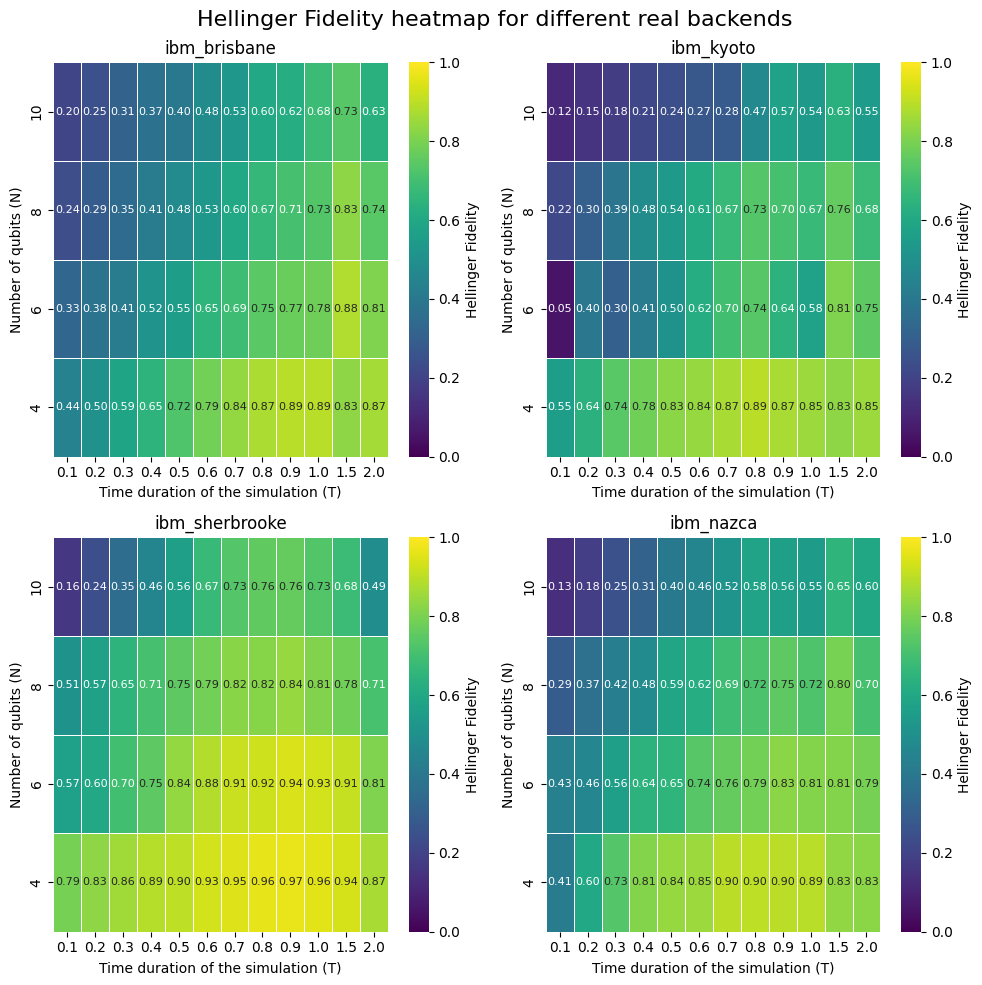

In [113]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    sns.heatmap(hf_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Hellinger Fidelity'}, 
                annot_kws={"size": 8}, 
                ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Hellinger Fidelity heatmap for different real backends', fontsize=16)
plt.tight_layout()
plt.show()

### Total Variational Distance

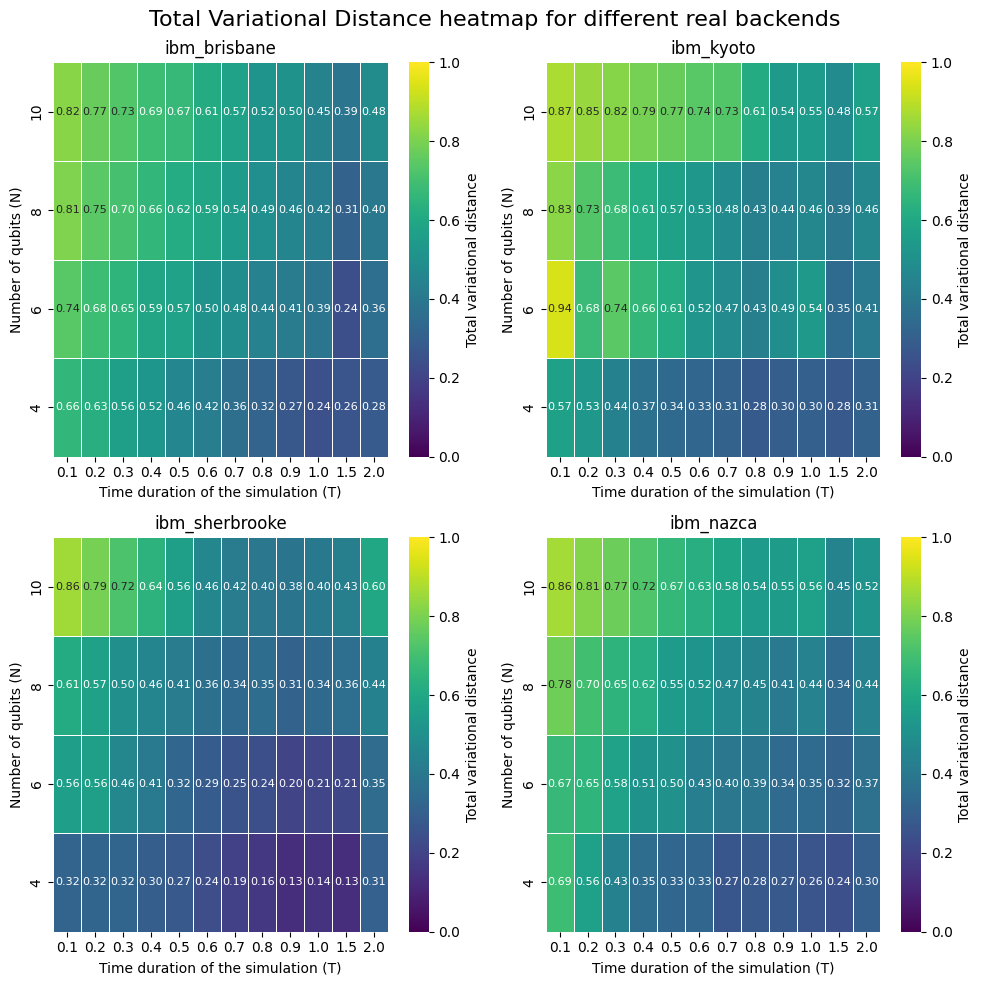

In [115]:
# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    sns.heatmap(tv_heatmap_datas[systems[i]], 
                cmap='viridis', 
                linewidths=0.5, 
                annot=True, 
                fmt=".2f", 
                cbar_kws={'label': 'Total variational distance'}, 
                annot_kws={"size": 8}, ax=ax,
                vmin=0, 
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Total Variational Distance heatmap for different real backends', fontsize=16)
plt.tight_layout()
plt.show()

## ZNE plots

### ZNE study

In [120]:
dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','ZNE HF % change','ZNE TV % change']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','ZNE HF % change','ZNE TV % change']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','ZNE HF % change','ZNE TV % change']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','ZNE HF % change','ZNE TV % change']]

#### Percentage difference

In [55]:
systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='ZNE HF % change').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='ZNE TV % change').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

In [56]:
hf_heatmap_datas['ibm_brisbane']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,26.294063,17.663208,12.833589,5.703573,1.641380,0.516396,-0.384215,-0.253180,-1.815160,0.292191,-0.117526,1.391623
8,27.975519,23.387890,13.633760,5.430765,2.897356,-0.711937,-3.870289,-4.156242,-4.028735,-2.914441,0.845592,1.933296
6,27.692374,22.858440,15.686599,7.406846,1.535168,0.739862,-3.201467,-4.287486,-3.195211,-3.153394,0.029182,0.973379
4,33.631478,17.504046,14.322539,0.260336,-1.112154,5.073102,-1.636851,-8.423863,-13.120167,-8.649752,-10.095315,-0.211896


In [57]:
hf_heatmap_datas['ibm_kyoto']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,46.024871,32.844496,12.384011,-0.191883,-1.086223,-2.849814,-4.287059,-4.473099,-1.906047,-1.826532,0.661338,0.952660
8,31.541722,25.901605,18.739896,14.219016,4.970140,3.639770,3.372817,3.519359,3.337825,1.394163,0.752548,3.747762
6,-16.128118,26.790008,12.039876,-1.297066,1.097953,3.936682,0.288984,3.806243,-2.486577,-7.265665,-0.952105,6.533758
4,12.355520,11.097034,7.341985,9.596579,8.552423,5.469203,4.344564,5.754868,4.284414,3.869162,0.780451,0.833659


In [58]:
hf_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,34.760052,23.334067,14.585896,10.003671,4.435983,1.560440,-0.667972,-0.300486,-0.181071,0.483684,-0.773013,0.906631
8,24.537791,20.782917,12.716391,7.964392,6.031510,2.966258,2.585368,2.147504,3.234371,-1.260075,0.388341,1.899949
6,20.499246,19.143563,13.616807,13.726774,5.186593,6.031121,0.228957,-1.754837,-0.110532,-0.494790,5.625723,4.549609
4,19.394469,13.768647,7.438533,1.532589,-0.491059,2.725076,1.670258,1.936414,1.499721,3.439773,2.612736,6.825836


In [59]:
tv_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,2.622375,3.588717,3.843640,2.413230,1.173557,0.561464,-0.316947,-0.594138,-0.111146,0.629957,-2.561866,0.937932
8,6.294102,6.829567,3.752884,5.468878,5.579376,2.042308,1.077659,3.213689,5.969810,-2.834445,-1.796486,1.132864
6,11.120578,9.358691,11.178517,14.052782,5.658157,8.533542,0.107481,-1.602103,0.124386,-3.854898,12.938897,15.563007
4,9.164686,9.227245,6.651316,-2.078713,1.395001,15.511173,14.187112,14.487171,13.660443,25.346554,4.386777,17.130707


## FFZNE plots

In [62]:
dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','FFZNE HF % change','FFZNE TV % change']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','FFZNE HF % change','FFZNE TV % change']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','FFZNE HF % change','FFZNE TV % change']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','FFZNE HF % change','FFZNE TV % change']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='FFZNE HF % change').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='FFZNE TV % change').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

In [63]:
hf_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,28.561709,18.217846,11.879503,7.716658,3.043661,1.107395,-1.821172,-1.589529,-3.908105,-3.036209,-1.330434,0.631999
8,11.747524,10.909897,7.735691,5.168813,3.353527,1.678513,1.156246,-0.722698,-0.297140,-2.552853,-0.482073,1.367558
6,4.967293,3.803077,3.217465,2.678656,1.254864,1.001590,-0.380882,-0.883030,-0.138395,-0.356446,0.020625,0.893633
4,4.670667,4.105927,2.827614,2.104281,1.113944,0.228397,-0.020993,-0.401759,-0.178424,0.218639,-0.286216,0.152689


In [64]:
tv_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,2.160968,3.262969,2.901066,1.698757,0.875021,0.495578,-0.818053,-1.206131,-2.574919,-2.364777,-4.253323,0.675910
8,2.975034,3.483138,2.354730,3.230777,2.672306,0.950339,0.468962,-0.583444,-0.485325,-4.640954,-3.554452,1.050097
6,2.740236,1.382312,1.666613,2.037380,1.751593,1.236618,-0.474333,-0.914310,0.348618,-1.833702,-1.042256,4.485100
4,2.659367,2.923706,4.580024,5.071435,3.565159,0.794093,-0.684956,-0.604207,-1.369513,-1.536518,-7.491762,3.959062


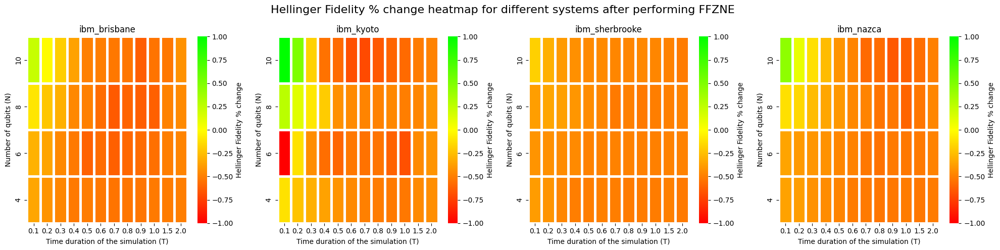

In [103]:
from matplotlib.colors import LinearSegmentedColormap

# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Define custom colormap
colors = [(1, 0, 0), (1, 1, 0), (0, 1, 0)]  # red -> white -> green
cmap = LinearSegmentedColormap.from_list('custom', colors, N=256)

for i, ax in enumerate(axes.flat):
    sns.heatmap(hf_heatmap_datas[systems[i]], 
                cmap=cmap, 
                linewidths=2.5, 
                fmt=".2f", 
                cbar_kws={'label': 'Hellinger Fidelity % change'}, 
                ax=ax,
                vmin=-1,
                vmax=1
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Hellinger Fidelity % change heatmap for different systems after performing FFZNE', fontsize=16)
plt.tight_layout()
plt.show()

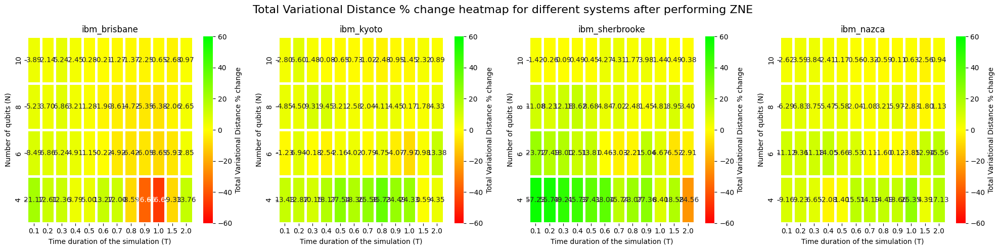

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

# Plot grid of 1x4 heatmaps
fig, axes = plt.subplots(1, 4, figsize=(20, 5))

# Define custom colormap
colors = [(1, 0, 0), (1, 1, 0), (0, 1, 0)]  # red -> white -> green
cmap = LinearSegmentedColormap.from_list('custom', colors, N=256)

for i, ax in enumerate(axes.flat):
    sns.heatmap(tv_heatmap_datas[systems[i]], 
                cmap=cmap, 
                linewidths=2.5, 
                fmt=".2f", 
                cbar_kws={'label': 'Total Variational Distance % change'}, 
                ax=ax,
                annot=True,
                vmin=-60,
                vmax=60
                )
    
    ax.set_title(f'{systems[i]}')
    ax.set_xlabel('Time duration of the simulation (T)')
    ax.set_ylabel('Number of qubits (N)')

plt.suptitle('Total Variational Distance % change heatmap for different systems after performing ZNE', fontsize=16)
plt.tight_layout()
plt.show()

## RBZNE plots

In [65]:
dfs = {}
dfs['ibm_brisbane'] = data[data['System'] == 'ibm_brisbane'][['N','T','RBZNE HF % change','RBZNE TV % change']]
dfs['ibm_kyoto'] = data[data['System'] == 'ibm_kyoto'][['N','T','RBZNE HF % change','RBZNE TV % change']]
dfs['ibm_sherbrooke'] = data[data['System'] == 'ibm_sherbrooke'][['N','T','RBZNE HF % change','RBZNE TV % change']]
dfs['ibm_nazca'] = data[data['System'] == 'ibm_nazca'][['N','T','RBZNE HF % change','RBZNE TV % change']]

systems = list(dfs.keys())

hf_heatmap_datas = {}
tv_heatmap_datas = {}

# Pivot the data to create a 2D heatmap
for system,df in dfs.items():
    hf_heatmap_data = df.pivot_table(index='N', columns='T', values='RBZNE HF % change').sort_values(by='N', ascending=False)
    tv_heatmap_data = df.pivot_table(index='N', columns='T', values='RBZNE TV % change').sort_values(by='N', ascending=False)
    hf_heatmap_datas[system] = hf_heatmap_data
    tv_heatmap_datas[system] = tv_heatmap_data

In [66]:
hf_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,68.398602,47.218442,29.225098,21.124924,9.074518,2.000686,3.332150,1.021320,-1.168291,-1.846720,-2.696039,1.583849
8,37.059184,31.788446,19.484001,12.093414,8.679939,3.229277,3.791152,3.968610,4.182338,-3.743130,0.457808,2.233283
6,24.389332,22.628544,15.867709,15.203917,6.040041,6.563124,0.394176,-1.355636,0.748889,-0.321693,5.946147,5.215646
4,23.982600,18.030058,11.215118,5.179176,1.913941,-2.007953,0.655692,2.534021,2.235617,4.023764,2.979529,6.754903


In [67]:
tv_heatmap_datas['ibm_nazca']

T,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,1.5,2.0
N,,,,,,,,,,,,
10,5.033027,5.119389,8.765884,6.288572,2.443352,0.133160,2.194122,0.531565,-0.368425,-0.131047,-5.551902,2.550041
8,9.429534,10.236905,6.158668,6.104853,9.234647,2.629259,2.111435,7.336605,8.478466,-6.411179,-3.968763,0.223615
6,13.795559,11.862732,13.045214,15.099988,7.317444,9.206127,-0.222753,-1.026864,2.206631,-4.505996,14.255684,20.234214
4,12.049946,14.871849,17.554784,11.874587,17.169736,13.865837,11.762462,14.937230,13.019189,21.944555,4.542011,18.937303


## Comparative study

### Line plot for values

In [73]:
import matplotlib.pyplot as plt

def plot_hf_for_system(system, data):
    x_values = list(data['T'].unique())
    y_values = []

    line_mapping = ['Baseline', 'ZNE HF', 'FFZNE HF', 'RBZNE HF']

    for N in [4,6,8,10]:
        hf = data[(data['System'] == system) & (data['N'] == N)]['Noise HF']
        zne_hf = data[(data['System'] == system) & (data['N'] == N)]['ZNE HF']
        ffzne_hf = data[(data['System'] == system) & (data['N'] == N)]['FFZNE HF']
        rbzne_hf = data[(data['System'] == system) & (data['N'] == N)]['RBZNE HF']
        y_values.append([hf, zne_hf, ffzne_hf, rbzne_hf])

    # Create a 2x2 grid of multi-line plots
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            idx = i * 2 + j
            for line_num, y_data in enumerate(y_values[idx]):
                ax.plot(x_values, y_data, marker='o', linestyle='-', label=f'{line_mapping[line_num]}')
            ax.set_xlabel('Time duration of the simulation (T)')
            ax.set_ylabel('Hellinger fidelity')
            ax.set_title(f'N = {idx*2 + 4}')
            ax.grid(True)
            ax.legend()

    plt.suptitle(f'Hellinger fidelity for {system} and different N and methods', fontsize=16)
    plt.tight_layout()
    plt.show()

def plot_tv_for_system(system,data):
    x_values = list(data['T'].unique())
    y_values = []

    line_mapping = ['Baseline', 'ZNE TV', 'FFZNE TV', 'RBZNE TV']

    for N in [4,6,8,10]:
        tv = data[(data['System'] == system) & (data['N'] == N)]['Noise TV']
        zne_tv = data[(data['System'] == system) & (data['N'] == N)]['ZNE TV']
        ffzne_tv = data[(data['System'] == system) & (data['N'] == N)]['FFZNE TV']
        rbzne_tv = data[(data['System'] == system) & (data['N'] == N)]['RBZNE TV']
        y_values.append([tv, zne_tv, ffzne_tv, rbzne_tv])

    # Create a 2x2 grid of multi-line plots
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            idx = i * 2 + j
            for line_num, y_data in enumerate(y_values[idx]):
                ax.plot(x_values, y_data, marker='o', linestyle='-', label=f'{line_mapping[line_num]}')
            ax.set_xlabel('Time duration of the simulation (T)')
            ax.set_ylabel('Total variational distance')
            ax.set_title(f'N = {idx*2 + 4}')
            ax.grid(True)
            ax.legend()

    plt.suptitle(f'Total variational distance for {system} and different N and methods', fontsize=16)
    plt.tight_layout()
    plt.show()

def plot_hf_percentage_change_for_system(system, data):
    x_values = list(data['T'].unique())
    y_values = []

    line_mapping = ['ZNE HF % change', 'FFZNE HF % change', 'RBZNE HF % change']

    for N in [4,6,8,10]:
        zne_hf = data[(data['System'] == system) & (data['N'] == N)]['ZNE HF % change']
        ffzne_hf = data[(data['System'] == system) & (data['N'] == N)]['FFZNE HF % change']
        rbzne_hf = data[(data['System'] == system) & (data['N'] == N)]['RBZNE HF % change']
        y_values.append([zne_hf, ffzne_hf, rbzne_hf])

    # Create a 2x2 grid of multi-line plots
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            idx = i * 2 + j
            for line_num, y_data in enumerate(y_values[idx]):
                ax.plot(x_values, y_data, marker='o', linestyle='-', label=f'{line_mapping[line_num]}')
            ax.axhline(y=0, color='red', linestyle='--', label='Baseline')
            ax.set_xlabel('Time duration of the simulation (T)')
            ax.set_ylabel('Hellinger fidelity % change')
            ax.set_title(f'N = {idx*2 + 4}')
            ax.grid(True)
            ax.legend()

    plt.suptitle(f'Hellinger fidelity % change for {system} and different N and methods', fontsize=16)
    plt.tight_layout()
    plt.show()

def plot_tv_percentage_change_for_system(system,data):
    x_values = list(data['T'].unique())
    y_values = []

    line_mapping = ['ZNE TV % change', 'FFZNE TV % change', 'RBZNE TV % change']

    for N in [4,6,8,10]:
        zne_tv = data[(data['System'] == system) & (data['N'] == N)]['ZNE TV % change']
        ffzne_tv = data[(data['System'] == system) & (data['N'] == N)]['FFZNE TV % change']
        rbzne_tv = data[(data['System'] == system) & (data['N'] == N)]['RBZNE TV % change']
        y_values.append([zne_tv, ffzne_tv, rbzne_tv])

    # Create a 2x2 grid of multi-line plots
    fig, axes = plt.subplots(2, 2, figsize=(10, 8))

    for i in range(2):
        for j in range(2):
            ax = axes[i, j]
            idx = i * 2 + j
            for line_num, y_data in enumerate(y_values[idx]):
                ax.plot(x_values, y_data, marker='o', linestyle='-', label=f'{line_mapping[line_num]}')
            ax.axhline(y=0, color='red', linestyle='--', label='Baseline')
            ax.set_xlabel('Time duration of the simulation (T)')
            ax.set_ylabel('Total variational distance % change')
            ax.set_title(f'N = {idx*2 + 4}')
            ax.grid(True)
            ax.legend()

    plt.suptitle(f'Total variational distance % change for {system} and different N and methods', fontsize=16)
    plt.tight_layout()
    plt.show()

#### Hellinger fidelity

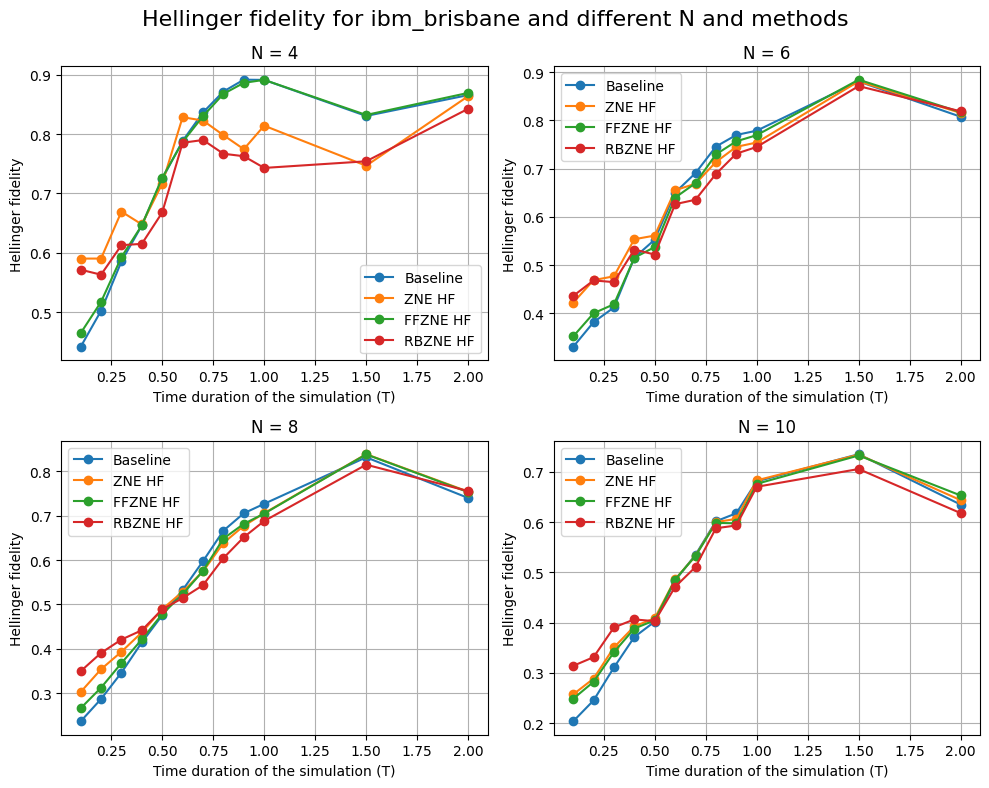

In [69]:
plot_hf_for_system("ibm_brisbane", data)

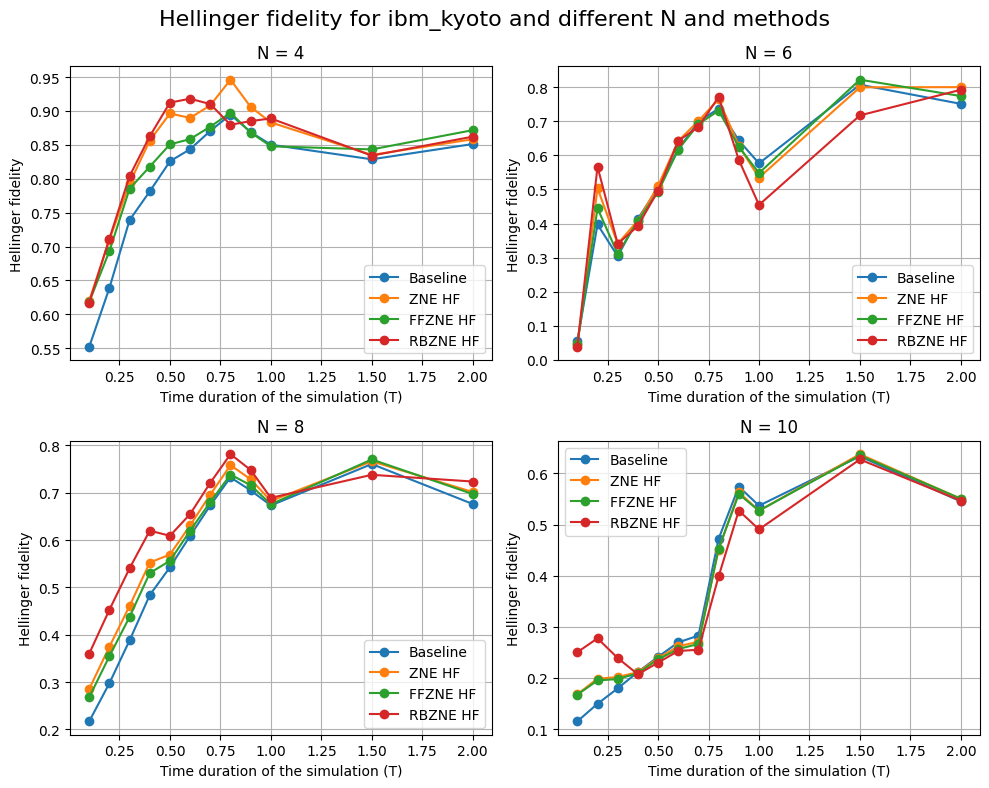

In [441]:
plot_hf_for_system("ibm_kyoto", data)

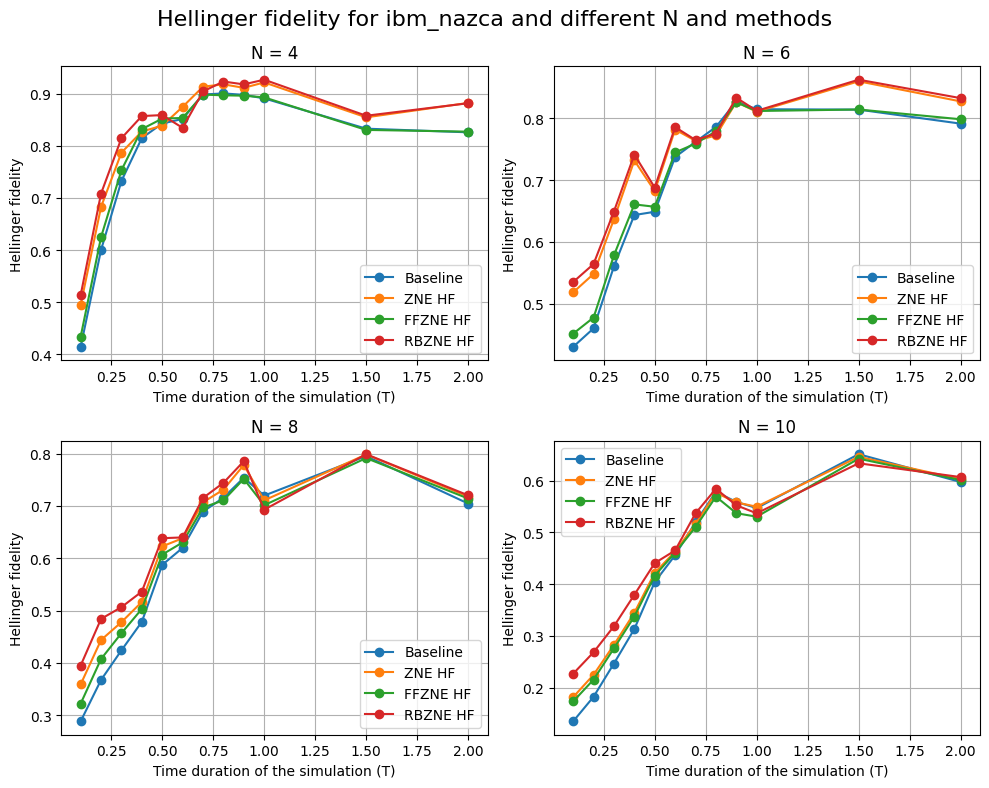

In [70]:
plot_hf_for_system("ibm_nazca", data)

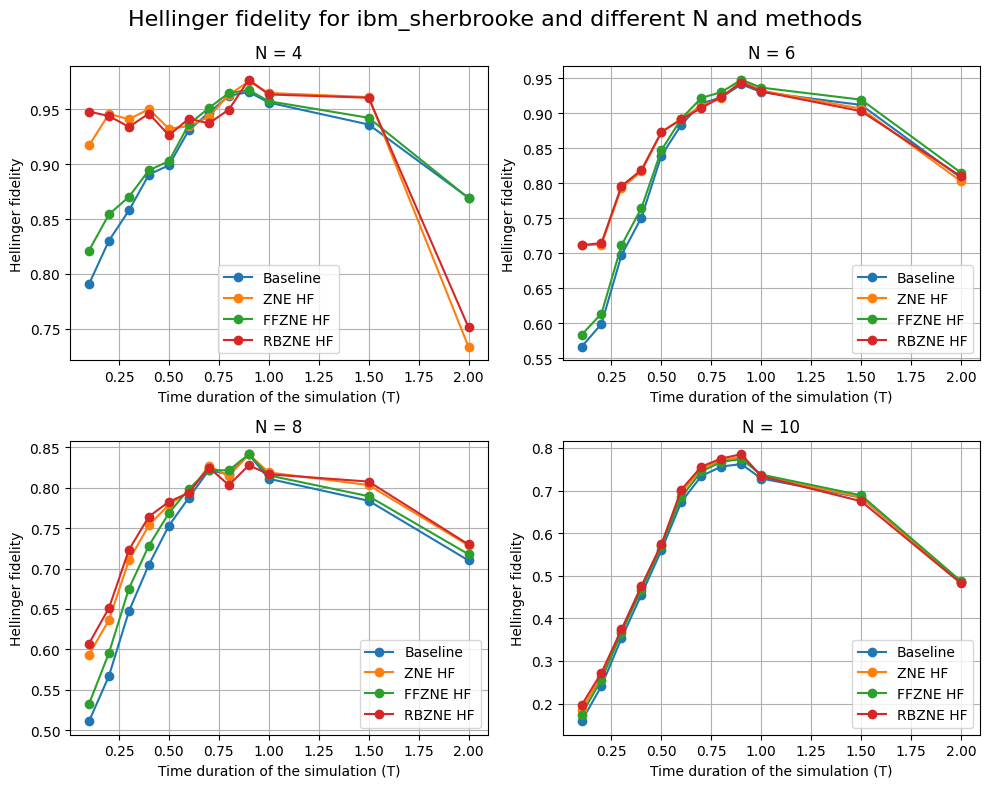

In [443]:
plot_hf_for_system("ibm_sherbrooke", data)

#### Total Variational Distance

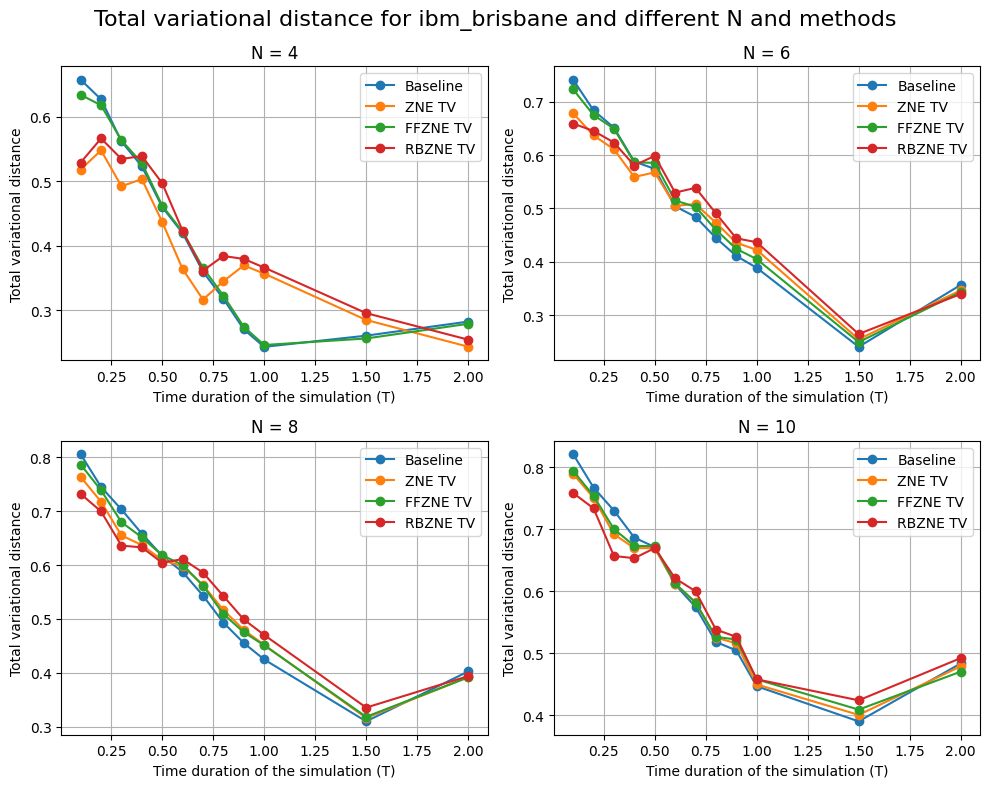

In [444]:
plot_tv_for_system("ibm_brisbane", data)

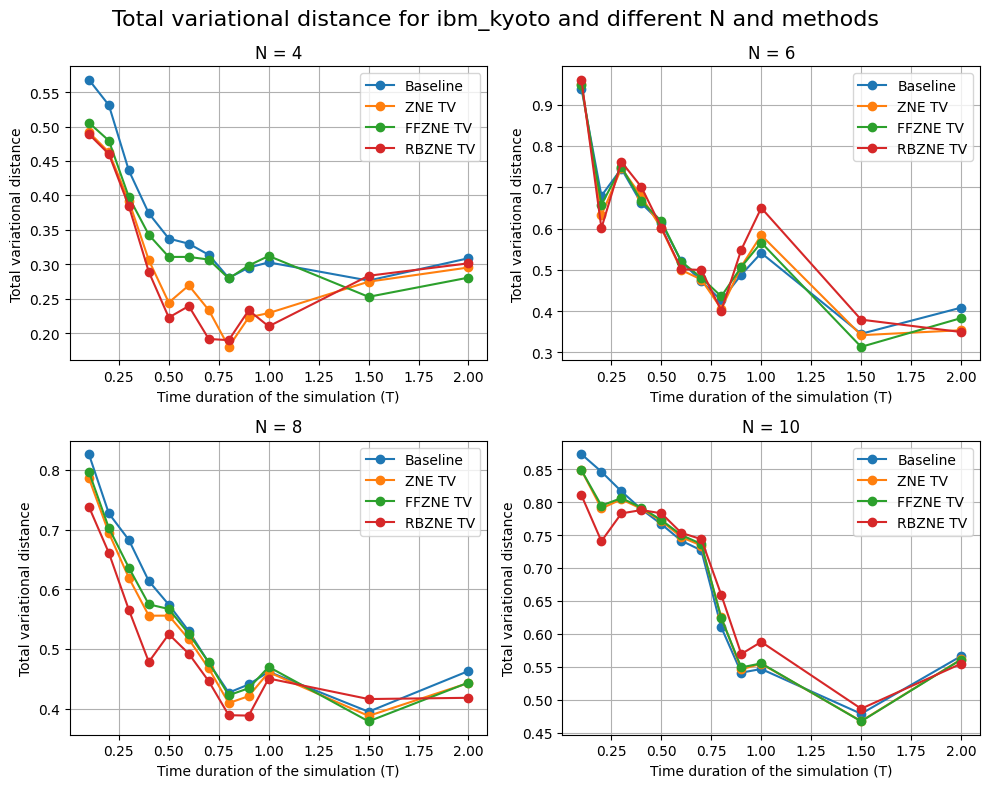

In [445]:
plot_tv_for_system("ibm_kyoto", data)

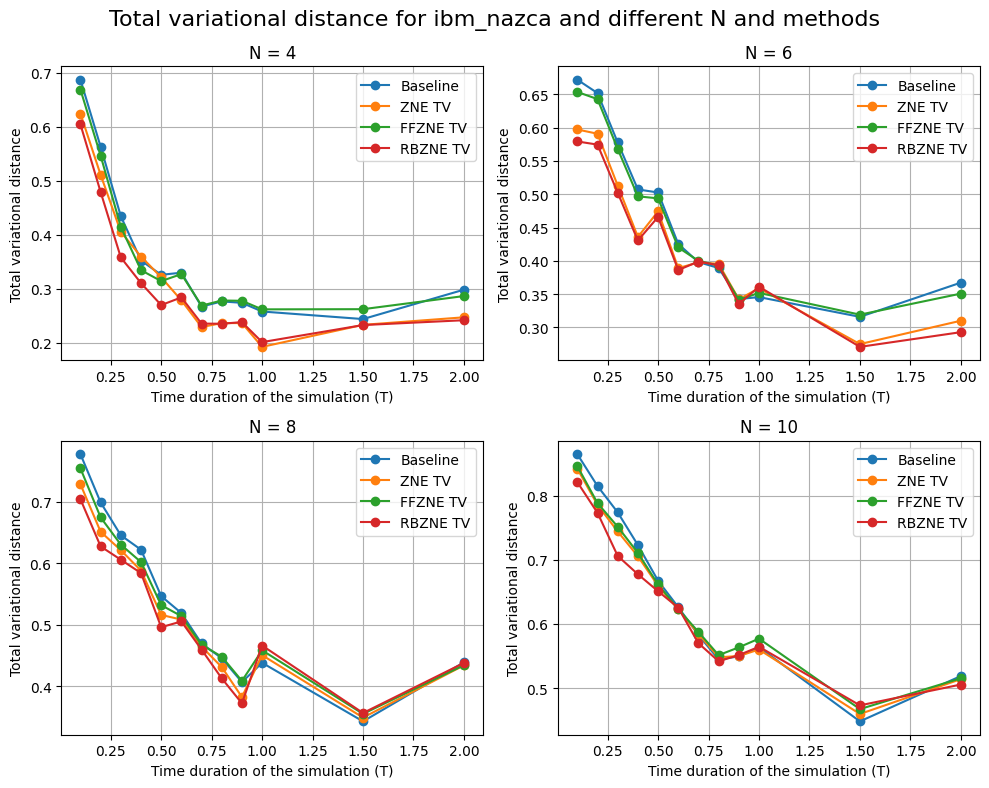

In [71]:
plot_tv_for_system("ibm_nazca", data)

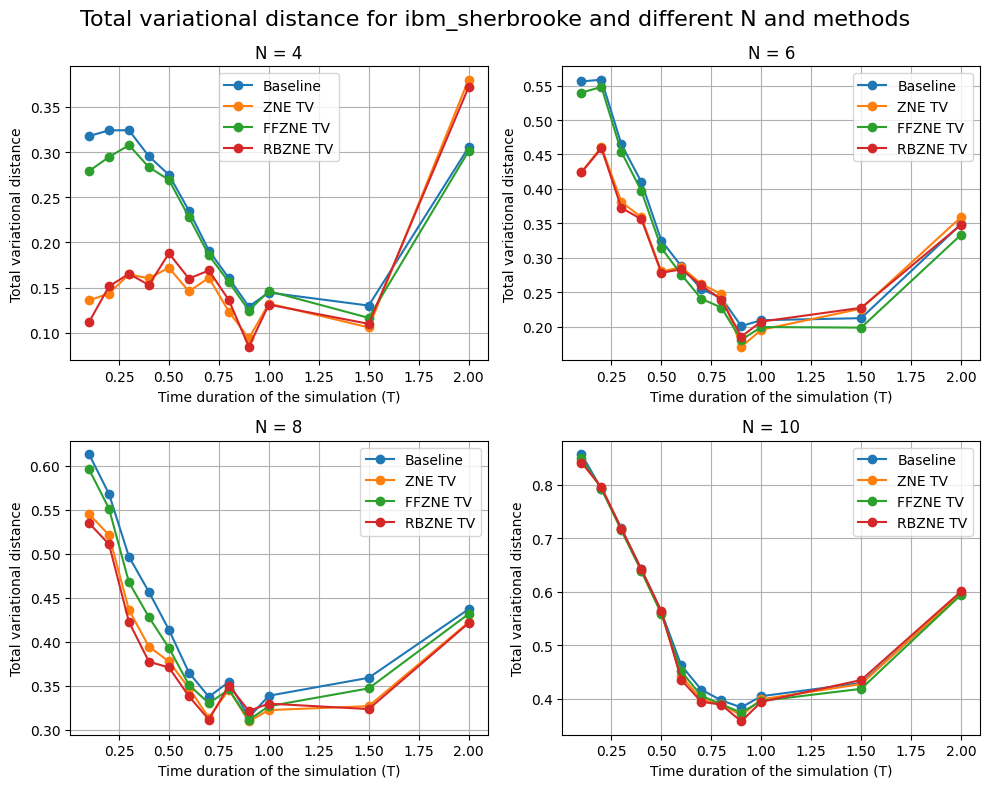

In [447]:
plot_tv_for_system("ibm_sherbrooke", data)

#### Hellinger percentage change

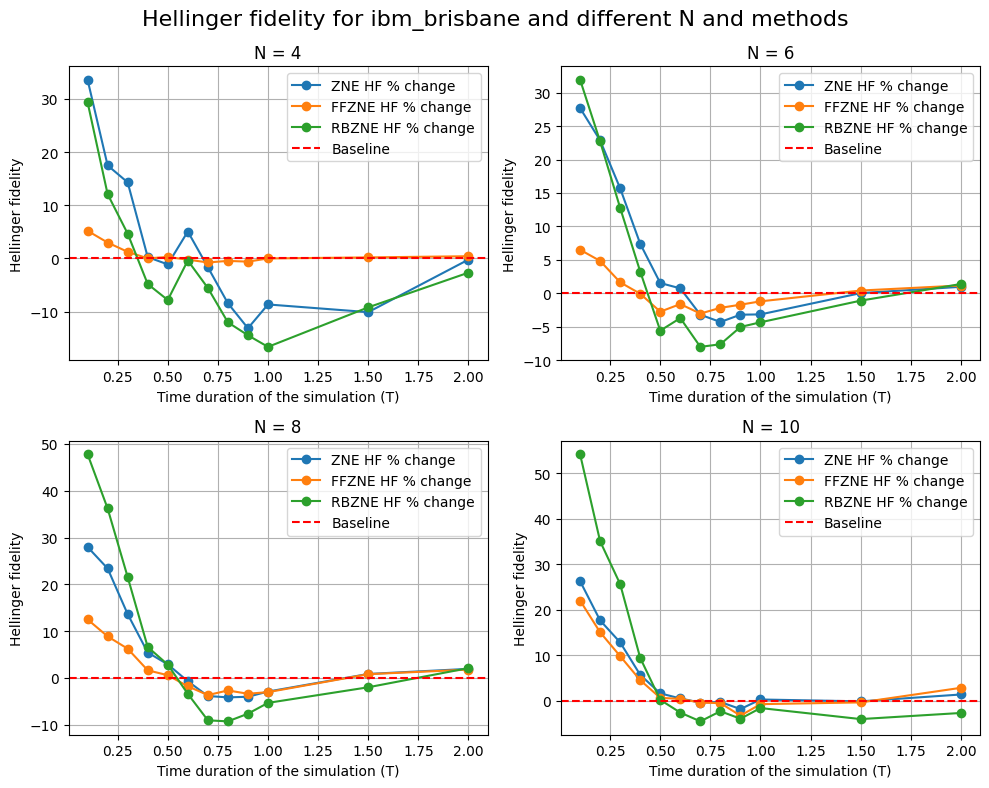

In [448]:
plot_hf_percentage_change_for_system("ibm_brisbane", data)

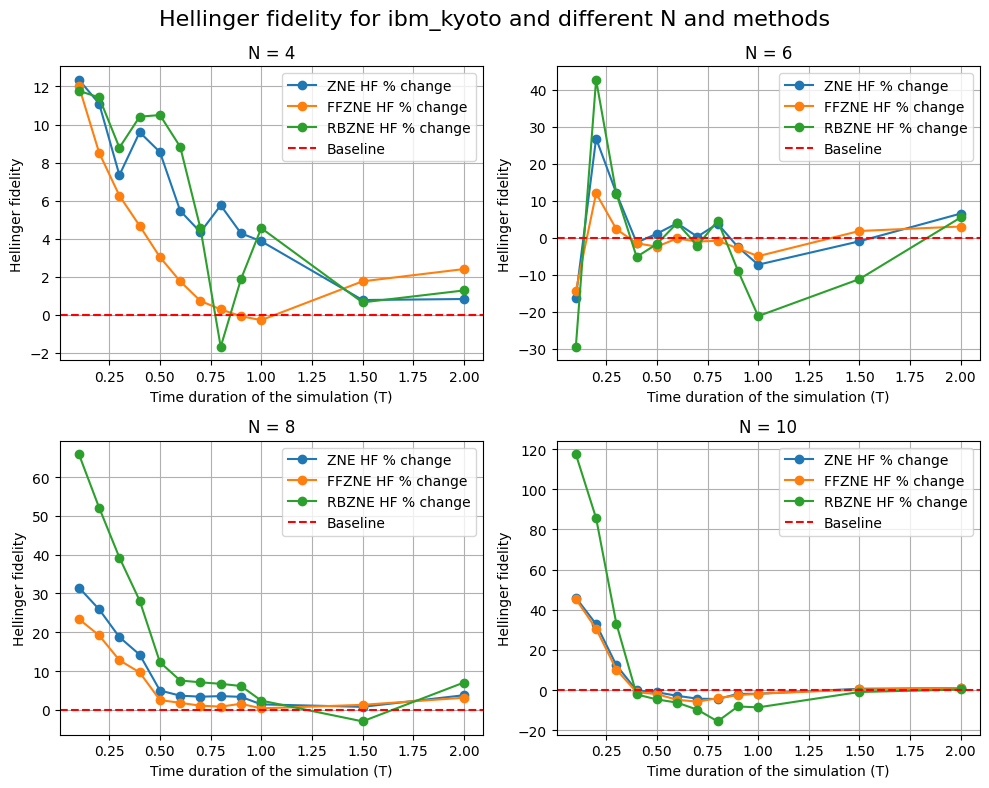

In [449]:
plot_hf_percentage_change_for_system("ibm_kyoto", data)

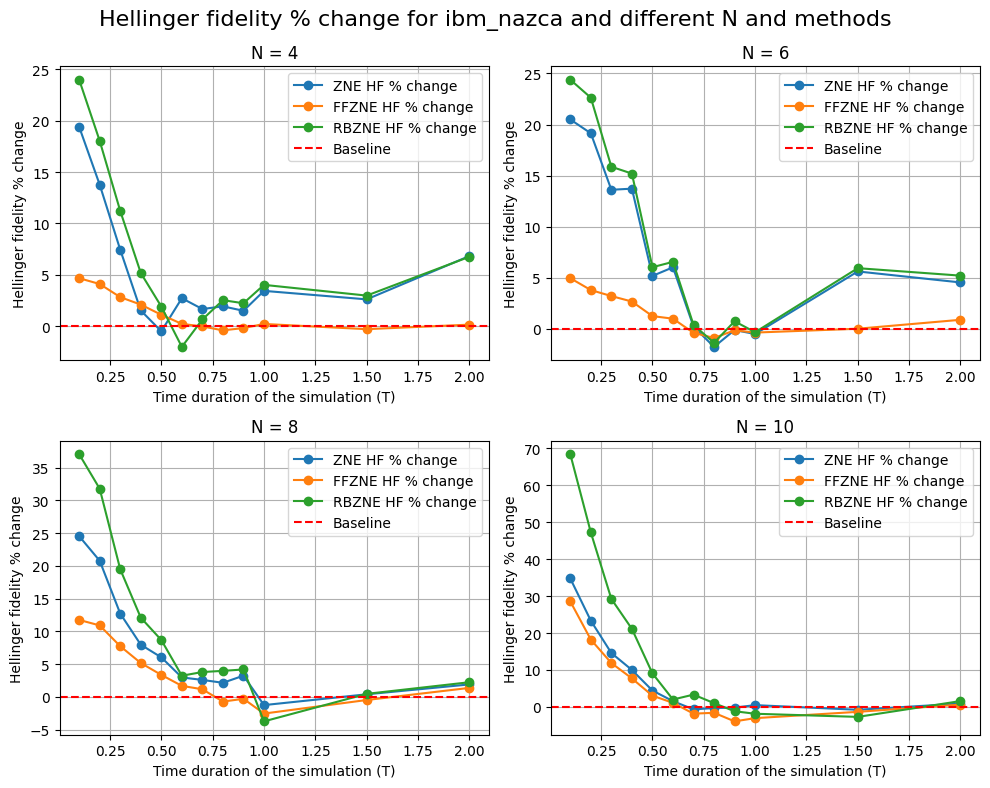

In [74]:
plot_hf_percentage_change_for_system("ibm_nazca", data)

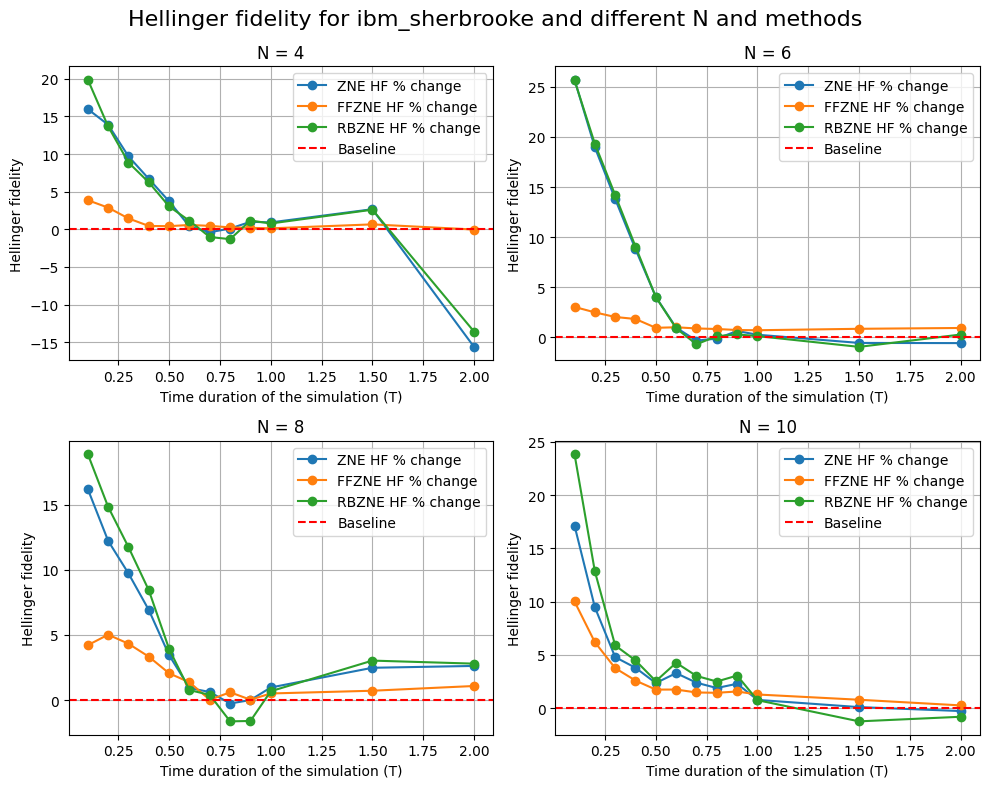

In [451]:
plot_hf_percentage_change_for_system("ibm_sherbrooke", data)

#### Total Variational Distance Percentage change

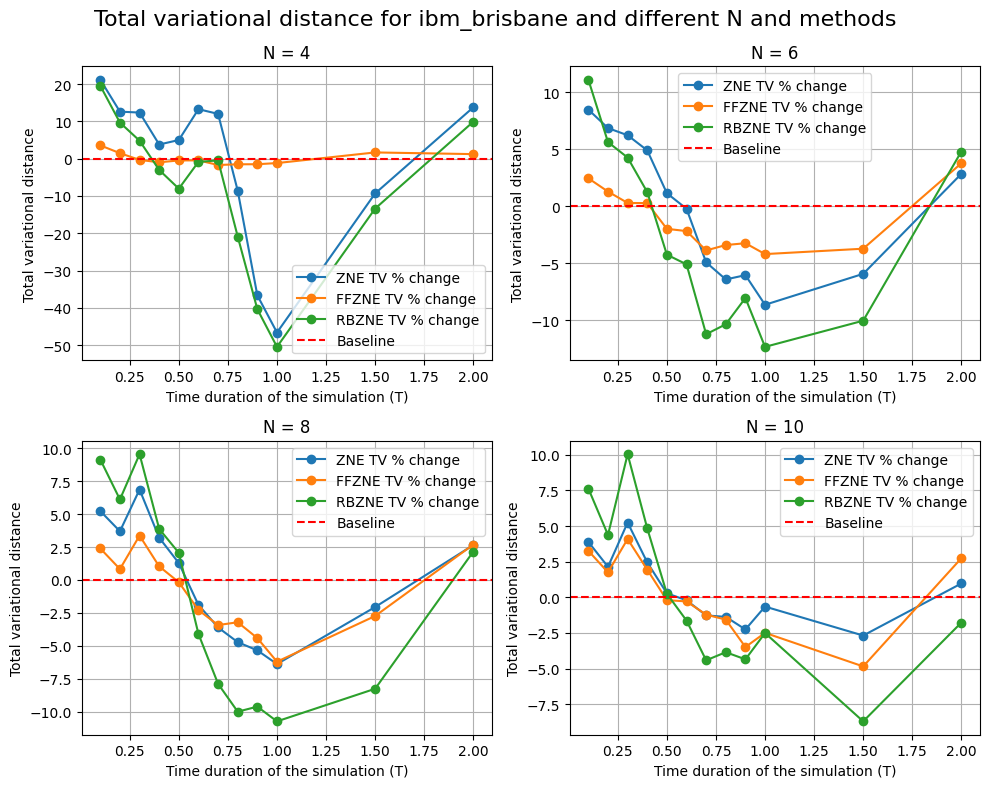

In [452]:
plot_tv_percentage_change_for_system("ibm_brisbane", data)

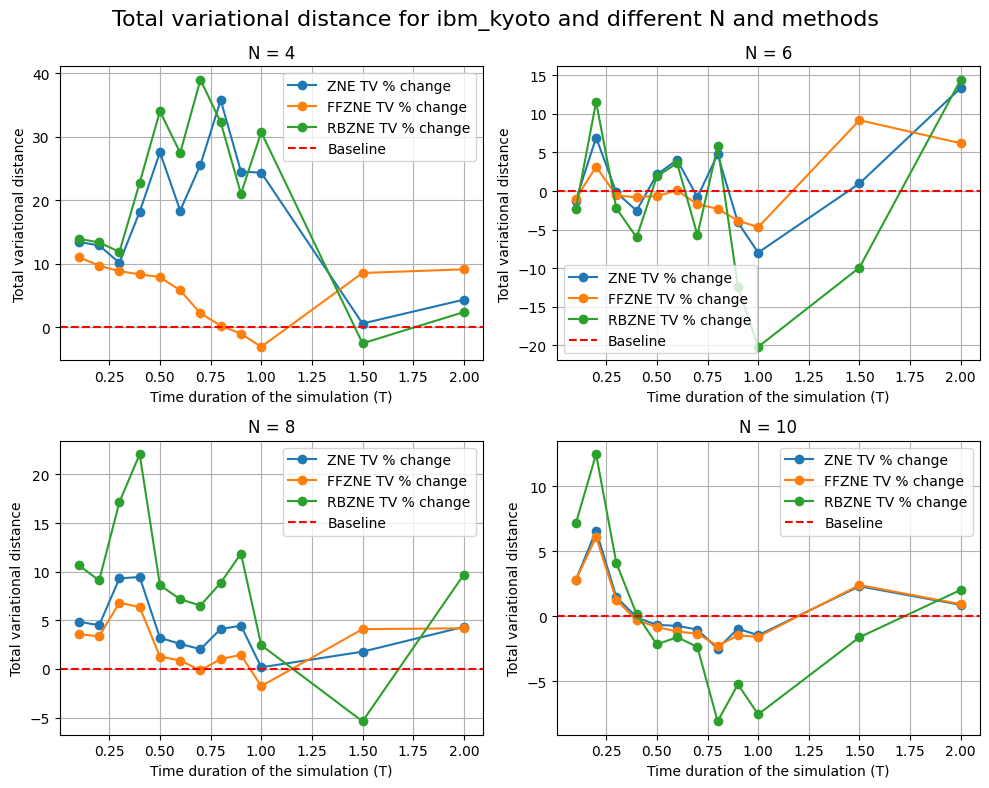

In [453]:
plot_tv_percentage_change_for_system("ibm_kyoto", data)

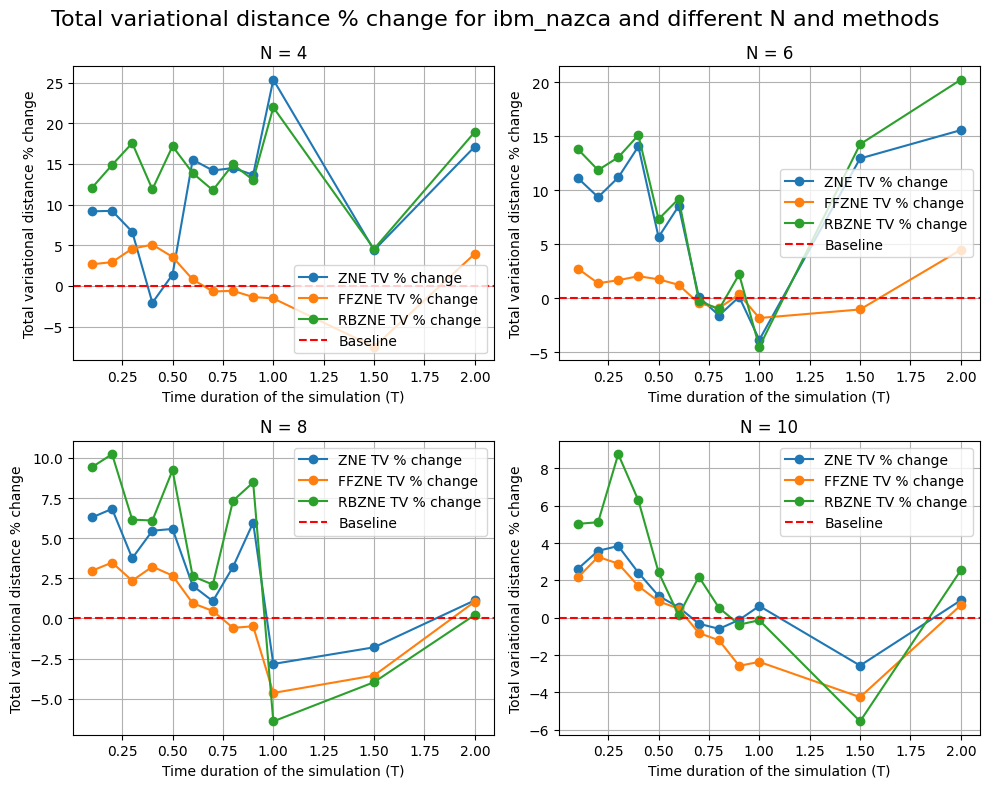

In [75]:
plot_tv_percentage_change_for_system("ibm_nazca", data)

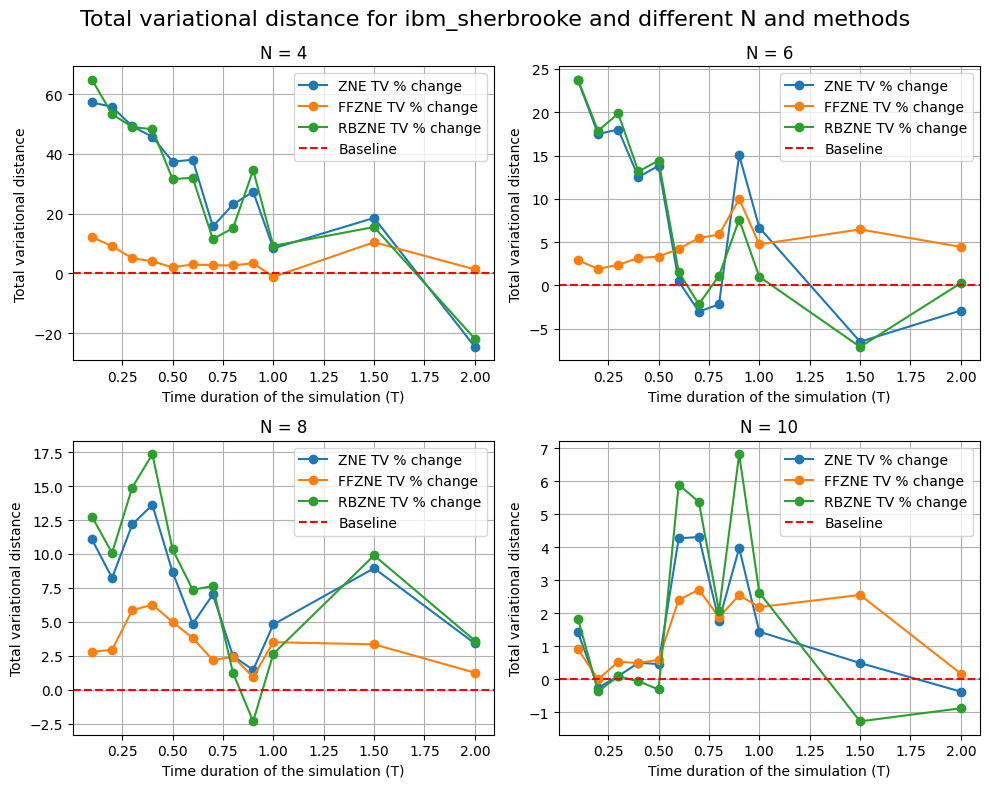

In [455]:
plot_tv_percentage_change_for_system("ibm_sherbrooke", data)

### Geometric mean

#### Geometric mean for each system and N

In [288]:
def get_geometric_means_for_system_and_N(system, data, dist):
    # Calculate the geometric mean for each N
    zne_geometric_means = list(map(lambda x: np.prod(1 + x/100)**(1/len(x)), [data[(data['System'] == system) & (data['N'] == 4)][f'ZNE {dist} % change'],
                                                                              data[(data['System'] == system) & (data['N'] == 6)][f'ZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 8)][f'ZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 10)][f'ZNE {dist} % change']]))

    ffzne_geomtric_means = list(map(lambda x: np.prod(1 + x/100)**(1/len(x)), [data[(data['System'] == system) & (data['N'] == 4)][f'FFZNE {dist} % change'],
                                                                              data[(data['System'] == system) & (data['N'] == 6)][f'FFZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 8)][f'FFZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 10)][f'FFZNE {dist} % change']]))

    rbzne_geometric_means = list(map(lambda x: np.prod(1 + x/100)**(1/len(x)), [data[(data['System'] == system) & (data['N'] == 4)][f'RBZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 6)][f'RBZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 8)][f'RBZNE {dist} % change'],
                                                                                data[(data['System'] == system) & (data['N'] == 10)][f'RBZNE {dist} % change']]))

    return [zne_geometric_means, ffzne_geomtric_means, rbzne_geometric_means]

##### Hellinger fidelity

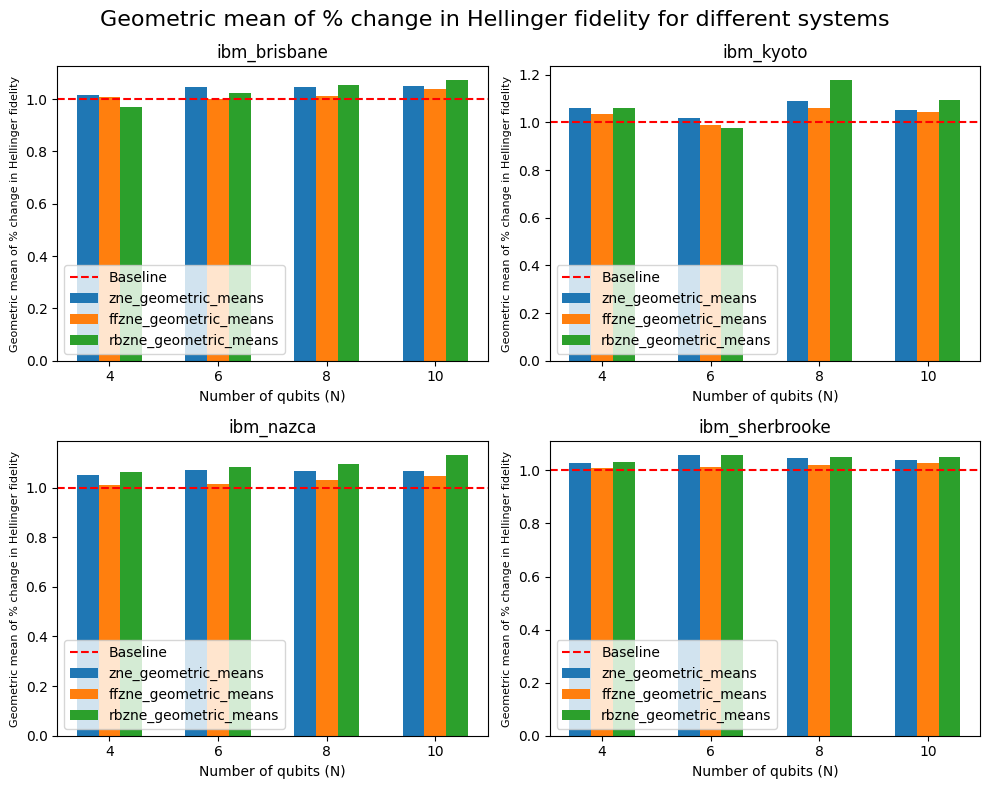

In [289]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
categories = [4,6,8,10]
ibm_brisbane_means = get_geometric_means_for_system_and_N('ibm_brisbane', data,'HF')
ibm_kyoto_means = get_geometric_means_for_system_and_N('ibm_kyoto', data,'HF')
ibm_nazca_means = get_geometric_means_for_system_and_N('ibm_nazca', data,'HF')
ibm_sherbrooke_means = get_geometric_means_for_system_and_N('ibm_sherbrooke', data,'HF')

# Define the width of the bars
bar_width = 0.2

# Set the position of the bars on the x-axis
x = np.arange(len(categories))

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Flatten the axes array to iterate over it
axes = axes.flatten()

group_labels = ['zne_geometric_means', 'ffzne_geometric_means', 'rbzne_geometric_means']
plot_labels = ['ibm_brisbane', 'ibm_kyoto', 'ibm_nazca', 'ibm_sherbrooke']   

# Plot each multi-bar graph in a subplot
for i, ax in enumerate(axes):
    if i == 0:
        values = ibm_brisbane_means

    elif i == 1:
        values = ibm_kyoto_means

    elif i == 2:
        values = ibm_nazca_means

    else:
        values = ibm_sherbrooke_means

        
    for j, v in enumerate(values):
        ax.bar(x + j * bar_width, v, width=bar_width, label=f'{group_labels[j]}')
        
    ax.set_xlabel('Number of qubits (N)')
    ax.set_ylabel('Geometric mean of % change in Hellinger fidelity', fontsize=8)
    ax.set_title(f'{plot_labels[i]}')
    ax.set_xticks(x + bar_width / 2 * (len(values) - 1))
    ax.set_xticklabels(categories)
    
    # Draw a horizontal line at y=1
    ax.axhline(y=1, color='red', linestyle='--', label='Baseline')
    ax.legend()

plt.suptitle('Geometric mean of % change in Hellinger fidelity for different systems', fontsize=16)
plt.tight_layout()
plt.show()


##### Total Variational Distance

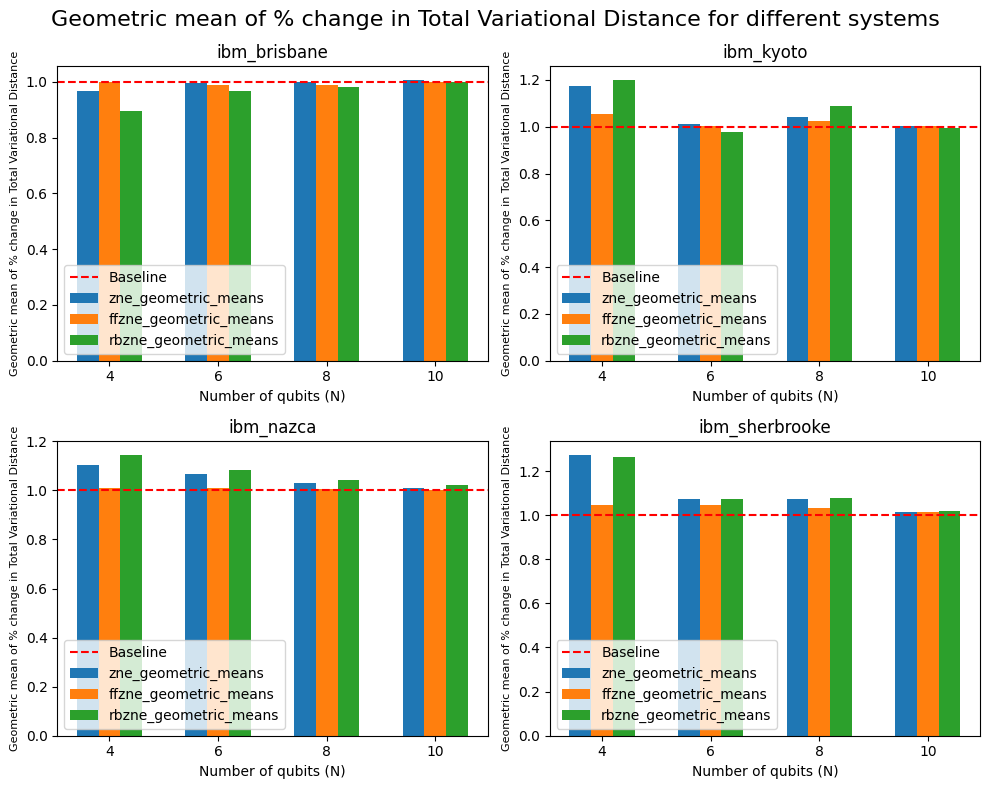

In [290]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
categories = [4,6,8,10]
ibm_brisbane_means = get_geometric_means_for_system_and_N('ibm_brisbane', data,'TV')
ibm_kyoto_means = get_geometric_means_for_system_and_N('ibm_kyoto', data,'TV')
ibm_nazca_means = get_geometric_means_for_system_and_N('ibm_nazca', data,'TV')
ibm_sherbrooke_means = get_geometric_means_for_system_and_N('ibm_sherbrooke', data,'TV')

# Define the width of the bars
bar_width = 0.2

# Set the position of the bars on the x-axis
x = np.arange(len(categories))

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# Flatten the axes array to iterate over it
axes = axes.flatten()

group_labels = ['zne_geometric_means', 'ffzne_geometric_means', 'rbzne_geometric_means']
plot_labels = ['ibm_brisbane', 'ibm_kyoto', 'ibm_nazca', 'ibm_sherbrooke']   

# Plot each multi-bar graph in a subplot
for i, ax in enumerate(axes):
    if i == 0:
        values = ibm_brisbane_means

    elif i == 1:
        values = ibm_kyoto_means

    elif i == 2:
        values = ibm_nazca_means

    else:
        values = ibm_sherbrooke_means

        
    for j, v in enumerate(values):
        ax.bar(x + j * bar_width, v, width=bar_width, label=f'{group_labels[j]}')
        
    ax.set_xlabel('Number of qubits (N)')
    ax.set_ylabel('Geometric mean of % change in Total Variational Distance', fontsize=8)
    ax.set_title(f'{plot_labels[i]}')
    ax.set_xticks(x + bar_width / 2 * (len(values) - 1))
    ax.set_xticklabels(categories)
    
    # Draw a horizontal line at y=1
    ax.axhline(y=1, color='red', linestyle='--', label='Baseline')
    ax.legend()

plt.suptitle('Geometric mean of % change in Total Variational Distance for different systems', fontsize=16)
plt.tight_layout()
plt.show()


#### Geometric mean for each system

In [280]:
import matplotlib.pyplot as plt

def get_geometric_means_for_dist(dist, data):
    # Calculate the geometric mean for each N

    from functools import reduce
    
    # Calculate the geometric mean for records with system as ibm_brisbane
    brisbane_transformed = list(map(lambda x: 1 + x/100, data[data['System'] == 'ibm_brisbane'][dist]))
    brisbane_geometric_mean = reduce(lambda x, y: x*y, brisbane_transformed)**(1/len(brisbane_transformed))

    kyoto_transformed = list(map(lambda x: 1 + x/100, data[data['System'] == 'ibm_kyoto'][dist]))
    kyoto_geometric_mean = reduce(lambda x, y: x*y, kyoto_transformed)**(1/len(kyoto_transformed))

    nazca_transformed = list(map(lambda x: 1 + x/100, data[data['System'] == 'ibm_nazca'][dist]))
    nazca_geometric_mean = reduce(lambda x, y: x*y, nazca_transformed)**(1/len(nazca_transformed))

    sherbrooke_transformed = list(map(lambda x: 1 + x/100, data[data['System'] == 'ibm_sherbrooke'][dist]))
    sherbrooke_geometric_mean = reduce(lambda x, y: x*y, sherbrooke_transformed)**(1/len(sherbrooke_transformed))

    return [brisbane_geometric_mean, kyoto_geometric_mean, nazca_geometric_mean, sherbrooke_geometric_mean]

##### Hellinger fidelity

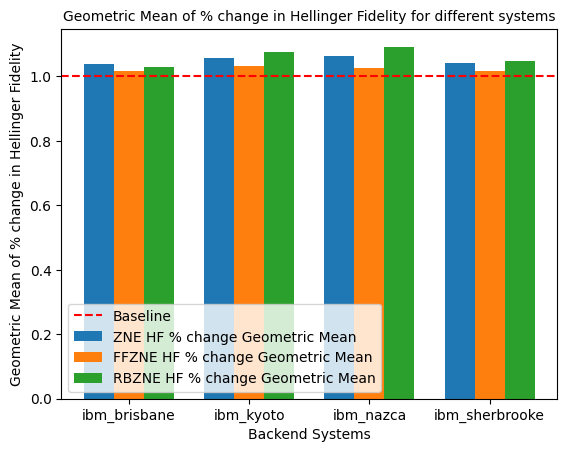

In [327]:
# Data
categories = ['ibm_brisbane', 'ibm_kyoto', 'ibm_nazca', 'ibm_sherbrooke']

zne_hf = get_geometric_means_for_dist('ZNE HF % change',data)  # Values for the first set of bars
ffzne_hf = get_geometric_means_for_dist('FFZNE HF % change',data)  # Values for the second set of bars
rbzne_hf = get_geometric_means_for_dist('RBZNE HF % change',data)  # Values for the third set of bars

# Bar width
bar_width = 0.25

# Positions for the bars
x = np.arange(len(categories))

# Plotting the bars
plt.bar(x, zne_hf, width=bar_width, label='ZNE HF % change Geometric Mean')
plt.bar(x + bar_width, ffzne_hf, width=bar_width, label='FFZNE HF % change Geometric Mean')
plt.bar(x + 2 * bar_width, rbzne_hf, width=bar_width, label='RBZNE HF % change Geometric Mean')

# Draw a horizontal line at y=1
plt.axhline(y=1, color='red', linestyle='--', label='Baseline')

# Adding labels and title
plt.xlabel('Backend Systems')
plt.ylabel('Geometric Mean of % change in Hellinger Fidelity')
plt.title('Geometric Mean of % change in Hellinger Fidelity for different systems', fontsize=10)
plt.xticks(x + bar_width, categories)
plt.legend()

# Show plot
plt.show()


##### Total Variational Distance

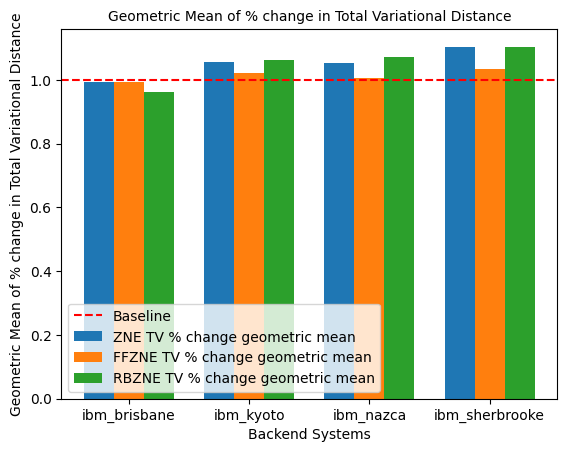

In [298]:
zne_tv = get_geometric_means_for_dist('ZNE TV % change',data)  # Values for the first set of bars
ffzne_tv = get_geometric_means_for_dist('FFZNE TV % change',data)  # Values for the second set of bars
rbzne_tv = get_geometric_means_for_dist('RBZNE TV % change',data)  # Values for the third set of bars

# Bar width
bar_width = 0.25

# Positions for the bars
x = np.arange(len(categories))

# Plotting the bars
plt.bar(x, zne_tv, width=bar_width, label='ZNE TV % change geometric mean')
plt.bar(x + bar_width, ffzne_tv, width=bar_width, label='FFZNE TV % change geometric mean')
plt.bar(x + 2 * bar_width, rbzne_tv, width=bar_width, label='RBZNE TV % change geometric mean')

# Draw a horizontal line at y=1
plt.axhline(y=1, color='red', linestyle='--', label='Baseline')

# Adding labels and title
plt.xlabel('Backend Systems')
plt.ylabel('Geometric Mean of % change in Total Variational Distance')
plt.title('Geometric Mean of % change in Total Variational Distance', fontsize=10)
plt.xticks(x + bar_width, categories)
plt.legend()

# Show plot
plt.show()


#### Geometric mean for each method

In [456]:
from functools import reduce

def get_geometric_mean_for_method(data,dist):

    hf_transformed = list(map(lambda x: 1 + x/100, data[f'{dist} HF % change'])) 
    hf_geometric_mean = reduce(lambda x, y: x*y, hf_transformed)**(1/len(hf_transformed))

    tv_transformed = list(map(lambda x: 1 + x/100, data[f'{dist} TV % change']))
    tv_geometric_mean = reduce(lambda x, y: x*y, tv_transformed)**(1/len(tv_transformed))

    return [hf_geometric_mean, tv_geometric_mean]

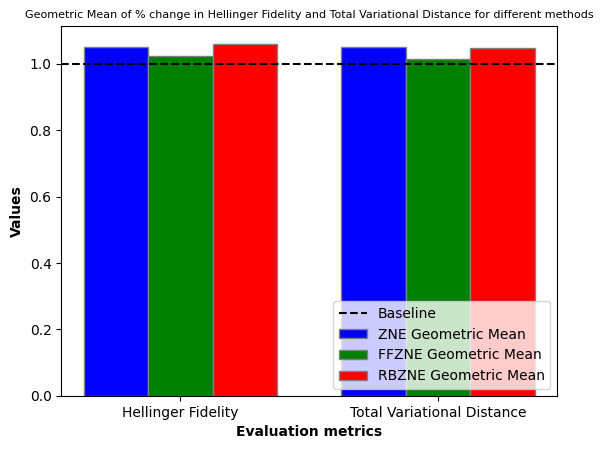

In [457]:
import matplotlib.pyplot as plt
import numpy as np

# Data
categories = ['Hellinger Fidelity', 'Total Variational Distance']
zne_means = get_geometric_mean_for_method(data,'ZNE')
ffzne_means = get_geometric_mean_for_method(data,'FFZNE')
rbzne_means = get_geometric_mean_for_method(data,'RBZNE')

# Set the width of the bars
bar_width = 0.25

# Set the positions of the bars on the x-axis
r1 = np.arange(len(categories))
r2 = [x + bar_width for x in r1]
r3 = [x + bar_width for x in r2]

# Plotting the bars
plt.bar(r1, zne_means, color='b', width=bar_width, edgecolor='grey', label='ZNE Geometric Mean')
plt.bar(r2, ffzne_means, color='g', width=bar_width, edgecolor='grey', label='FFZNE Geometric Mean')
plt.bar(r3, rbzne_means, color='r', width=bar_width, edgecolor='grey', label='RBZNE Geometric Mean')

# Add horizontal lines at y=1
plt.axhline(y=1, color='black', linestyle='--', label='Baseline')

# Adding labels and title
plt.xlabel('Evaluation metrics', fontweight='bold')
plt.ylabel('Values', fontweight='bold')
plt.xticks([r + bar_width for r in range(len(categories))], categories)
plt.title('Geometric Mean of % change in Hellinger Fidelity and Total Variational Distance for different methods', fontsize=8)

# Adding legend
plt.legend(loc='lower right')

# Show plot
plt.show()
